In [1]:
# import dependencies
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import random
import time
import gym
from scipy.stats import norm
from scipy.stats import t
import csv

import osmnx as ox
import folium
from shapely.geometry import Polygon

In [2]:
# find boundary of graph using a polygon 
boundary = Polygon([(-122.75593463884833, 38.48043857931626), (-122.75593463884833, 38.44276212966626), 
                    (-122.71602508838065, 38.44276212966626), (-122.71602508838065, 38.48043857931626)])

In [3]:
graph = ox.graph.graph_from_polygon(boundary, network_type = 'drive')
graph = graph.to_undirected()

graph = ox.speed.add_edge_speeds(graph, precision = 3)
graph = ox.speed.add_edge_travel_times(graph, precision = 3)

nodes, edges = ox.graph_to_gdfs(graph)

In [4]:
edges = edges.drop(columns = ['osmid', 'bridge', 'oneway', 'lanes', 'maxspeed', 
                              'geometry', 'ref', 'name'])

In [5]:
edges

highway   length  speed_kph  travel_time
u          v          key                                                
29892724   56004921   0    motorway_link  428.571     62.340       24.749
           354743884  0         motorway  808.128    104.607       27.811
           354744163  0         motorway  711.900    104.607       24.500
55950041   56072366   0      residential   99.541     40.877        8.766
           55950044   0         tertiary  125.287     48.280        9.342
...                                  ...      ...        ...          ...
7485461138 7485461140 0        secondary   71.846     56.327        4.592
7485461142 7485461143 0        secondary  161.471     56.327       10.320
8086515832 8086515836 0        secondary   54.661     56.327        3.494
8086515836 8086515838 0        secondary   14.175     56.327        0.906
8268741787 8268741788 0      residential   67.975     40.877        5.986

[1150 rows x 4 columns]

In [6]:
m = ox.plot_graph_folium(graph, popup_attribute = 'travel_time', weight = 3, color = '#660099')
m

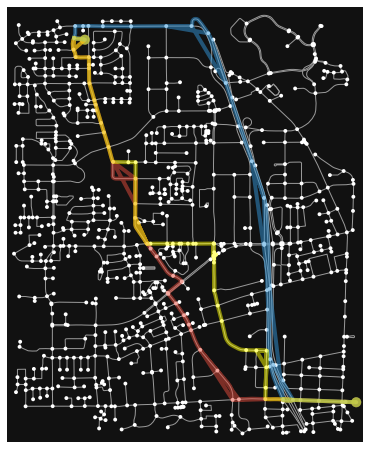

(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

In [7]:
colors = ['#E74C3C', '#3498DB', 'yellow']

sample_paths = []

#sample_paths.append(list(ox.distance.shortest_path(graph, 56102877, 1965862095, weight = 'length')))
#sample_paths.append(list(ox.distance.shortest_path(graph, 56102877, 1965862095, weight = 'travel_time')))
#sample_paths.append([56102877, 6940021052, 56102875, 56043223, 56102872, 55973175, 56004921, 55950049, 55950051, 55950052, 55950053, 56125038, 56078315, 56040934, 56084803, 56084797, 7049377524, 7049377523, 7049377522, 56084795, 7049377535, 7049377534, 7049377521, 7049377518, 56116115, 56116919, 56116921, 56116923, 8268741787, 56019308, 56021878, 7204303428, 56116927, 56157636, 56034980, 56129707, 56054706, 56097568, 56129711, 56117906, 56140110, 56055340, 56173132, 56102741, 56109019, 56027403, 56043321, 56101250, 56040774, 56017692, 56040783, 1965862095])
sample_paths = [[56102877,
  6940021052,
  56102875,
  56043223,
  56102872,
  55973175,
  56004921,
  55950049,
  56080181,
  56080182,
  56159412,
  56159417,
  56040936,
  56050201,
  56138412,
  56131668,
  56096746,
  7049316377,
  7028171795,
  56173160,
  56103899,
  7204303422,
  56116927,
  56157636,
  56034980,
  56129707,
  56129711,
  56117906,
  56140110,
  56055340,
  56173132,
  56102741,
  56109019,
  56027403,
  56043321,
  56101250,
  56040774,
  56017692,
  56040783,
  1965862095],
 [56102877,
  6940021052,
  56102875,
  56043223,
  56102872,
  55973175,
  56004921,
  29892724,
  354744163,
  339258728,
  354834803,
  354836487,
  354838667,
  55950091,
  56118644,
  56067542,
  56092140,
  56118642,
  56030097,
  56040785,
  56040783,
  1965862095],
 [56102877,
  6940021052,
  56102875,
  56043223,
  56102872,
  55973175,
  56004921,
  55950049,
  55950051,
  55950052,
  55950053,
  56125038,
  56078315,
  56040934,
  56084803,
  56084797,
  7049377524,
  7049377523,
  7049377522,
  56084795,
  7049377535,
  7049377534,
  7049377521,
  7049377518,
  56116115,
  56116919,
  56116921,
  56116923,
  8268741787,
  56019308,
  56021878,
  7204303428,
  56116927,
  56157636,
  56034980,
  56129707,
  56054706,
  56097568,
  56129711,
  56117906,
  56140110,
  56055340,
  56173132,
  56102741,
  56109019,
  56027403,
  56043321,
  56101250,
  56040774,
  56017692,
  56040783,
  1965862095]]

ox.plot.plot_graph_routes(graph, sample_paths, route_colors = colors)

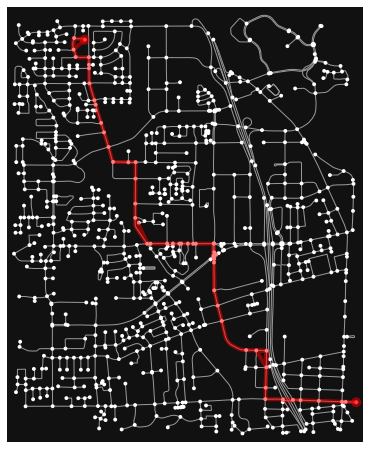

(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

In [12]:
ox.plot.plot_graph_route(graph, sample_paths[2])

In [8]:
def get_path_time(path):
    path_time = 0
    for i in range(len(path) - 1):
        path_time += graph[path[i]][path[i+1]][0]['travel_time'] + 30
        
    return path_time/60
        
            
route_times = {}
for i in range(len(sample_paths)):
    route_times[i] = [0.0, sample_paths[i]]

for i in range(len(sample_paths)):
    route_times[i][0] = get_path_time(sample_paths[i])
     

In [9]:
# print a travel time for each route 
time_list = []
for times in route_times:
    print(times, end=': ')
    print(route_times[times][0])
    time_list.append(route_times[times][0])
    
    
prob_path_1_over_time = []
prob_path_2_over_time = []
prob_path_3_over_time = []                

0: 26.539349999999992
1: 15.751483333333335
2: 33.18964999999999


In [10]:
data = open('Bayesian_Framework_TestV4.csv', 'w', newline='')
fieldnames = ['path_name', 'sample_size','12','13','14','15','16','17','18','19','20','21','22','23','24','25','26','27','28','29','30','31','32','33','34','35','36']
writer = csv.DictWriter(data, fieldnames=fieldnames)
writer.writeheader()

98

In [11]:
def training(iterations, minutes, prob1, prob2, prob3):
    N = iterations
    
    #============================
    # what are these variables for?
    pi_m = [];
    pi_s = [];
    #============================
    numberOfTimesRouteTaken = [0.,0.,0.]
    
    # stores only history since last update
    routeTravelTimes=[[],[],[]]  
    # stores entire history 
    allRouteTravelTimes=[[],[],[]]
    
    # decent estimate for average travel time for route i
    m = [16.,27.,33.]
    
    # number of times path i observed in the traning data 
    c=[0.,0.,0.]
    
    # average travel time for route i
    tbar=[0.,0.,0.]
    
    
    # time observed during the rth occurrence that the individual was observed to traverse path i during that occurence period
    sumtijsquared = [0.,0.,0.]
    
    # hyperparameters 
    v=[1.,1.,1.]
    a = [0.5,0.5,0.5]
    b = [0.1,0.1,0.1] 
    
    # mean 
    tloc = [16.10, 26.36, 33.06]
    
    # standard deviation
    tscale = [1.176, 1.296, 1.239]
    
    # degrees of freedom 
    tdf = [1.,1.,1.]

    # probability of time t given route x
    ptx = [0.,0.,0.]
    
    # probability of route x
    px = [0.,0.,0.]
    
    # probability of route x given time t
    pbxt = [0.,0.,0.]
    
    
    for x in range(0,N):
    
        #Pick a random path based on P_I
        randomNumber = random.uniform(0,1);
        pathLimit=0;
        for r in range(0,len(P_I)):
            pathLimit = pathLimit + P_I[r];
            if(randomNumber < pathLimit):
                randomPath = r;
                break;
        print("\nPath: "+str(randomPath));
    
        #Find a random time that it took for that path based on normal distribution for that path
        
        pathUserTime = random.normalvariate(pathMeanTimes[randomPath],pathStdOfTimes[randomPath]);
        print("User Time in Seconds: "+str(pathUserTime));
        routeTravelTimes[randomPath].append(pathUserTime);
        allRouteTravelTimes[randomPath].append(pathUserTime);
        
        
        numberOfTimesRouteTaken[randomPath] = numberOfTimesRouteTaken[randomPath] + 1;
        c[randomPath] = c[randomPath]+1;
        tbar[randomPath] = (tbar[randomPath]*(len(routeTravelTimes[randomPath])-1)+pathUserTime)/len(routeTravelTimes[randomPath]);
        sumtijsquared[randomPath] = sumtijsquared[randomPath] + pow(pathUserTime,2);
    
        print("tbar: " + str(tbar[randomPath]));
        print("c: " + str(c[randomPath]) );
        print("sumtijsquared: " + str(sumtijsquared[randomPath]));
        
        if(c[randomPath]%updateInterval==0):
            #Update prior hyperparameters
            oldm = m[randomPath];
            oldv = v[randomPath];
            olda = a[randomPath];
            oldb = b[randomPath];

            v[randomPath] = oldv/(1+c[randomPath]*oldv);
            m[randomPath] = (oldm/oldv+c[randomPath]*tbar[randomPath])*v[randomPath]        
            a[randomPath] = olda+c[randomPath]/2;

            b[randomPath] = oldb + (1/2)*(pow(oldm,2)/oldv+sumtijsquared[randomPath]-pow(m[randomPath],2)/v[randomPath]);
        
            c[randomPath] = 0; 
            tbar[randomPath] = 0;
            sumtijsquared[randomPath] = 0;
            routeTravelTimes[randomPath] = [];
        
            print("UPDATED HYPER PARAMS \nm: "+str(m[randomPath])+
            "\nv: " + str(v[randomPath]) + 
            "\na: " + str(a[randomPath]) +
            "\nb: " + str(b[randomPath]));
            
            
    for x in range(0,len(numberOfTimesRouteTaken)):    
        tloc[x] = m[x];
        tscale[x] = np.sqrt(b[x]*(1+v[x])/(a[x])); # should be under sqrt?
        tdf[x] = 2*a[x]; #2a?
        print(str(tdf[x]));
            
            
    #print("\nProbabilities for t = "+str(pathUserTime)+" (generated from route number "+str(randomPath)+")."); #using only the most recent travel time, pathUserTime for now.
    time_to_test = minutes
    print("\nProbabilities for t = "+str(time_to_test))
    for x in range(0,len(numberOfTimesRouteTaken)):
        print("ROUTE "+str(x)+"df = "+str(tdf[x]));
        # replace path user time to test different times
        # will test different nums for now instead of using random user time 
        ptx[x] = t.pdf(time_to_test, tdf[x], tloc[x], tscale[x]);#this is p(t|x)
        print("p(t|x): "+str(ptx[x]));
        px[x] = numberOfTimesRouteTaken[x]/sum(numberOfTimesRouteTaken); #this is p(x)
        print("p(x): "+str(px[x]));

    sumOfProbabilities = 0;
    for x in range(0,len(numberOfTimesRouteTaken)):    
        sumOfProbabilities = sumOfProbabilities + ptx[x]*px[x]; #this is p(t)

    for x in range(0,len(numberOfTimesRouteTaken)):     
        pbxt[x] = (ptx[x]*px[x])/sumOfProbabilities; #this is p(x|t)
        #print("Route " + str(x) +" pb(x|t): "+str(pbxt[x]));
        
        if x == 0:
            print("Freeway route probability given " + str(time_to_test) + " minutes = " + str(pbxt[x]))
            prob1.append(pbxt[x])
            
        if x == 1:
            print("Shorter backroads route probability given " + str(time_to_test) + " minutes = " + str(pbxt[x]))
            prob2.append(pbxt[x])
        if x == 2:
            print("Longer backroads route probability given " + str(time_to_test) + " minutes = " + str(pbxt[x]))
            prob3.append(pbxt[x])
            
    return prob1, prob2, prob3

# Set up Bayesian Framework 

15.794427065294466
1.068160098012055

26.922386218358305
1.0025801422027039

32.192304493670385
1.0994873037361295

Path: 0
User Time in Seconds: 15.653965842740837
tbar: 15.653965842740837
c: 1.0
sumtijsquared: 245.04664660569682
UPDATED HYPER PARAMS 
m: 15.82698292137042
v: 0.5
a: 1.0
b: 0.12993490949748435

Path: 0
User Time in Seconds: 14.985202800846736
tbar: 14.985202800846736
c: 1
sumtijsquared: 224.55630298250486
UPDATED HYPER PARAMS 
m: 15.546389547862525
v: 0.3333333333333333
a: 1.5
b: 0.36613283326710755

Path: 0
User Time in Seconds: 16.640436395028225
tbar: 16.640436395028225
c: 1
sumtijsquared: 276.9041234169799
UPDATED HYPER PARAMS 
m: 15.81990125965395
v: 0.25
a: 2.0
b: 0.814984772189581

Path: 1
User Time in Seconds: 26.9550855223152
tbar: 26.9550855223152
c: 1.0
sumtijsquared: 726.5766355153265
UPDATED HYPER PARAMS 
m: 26.9775427611576
v: 0.5
a: 1.0
b: 0.1005043275763228

Path: 0
User Time in Seconds: 15.432815337298882
tbar: 15.432815337298882
c: 1
sumtijsquared: 238

User Time in Seconds: 16.071292663655335
tbar: 16.071292663655335
c: 1
sumtijsquared: 258.2864478808618
UPDATED HYPER PARAMS 
m: 15.711529943038048
v: 0.014492753623188413
a: 34.5
b: 46.10667482014828

Path: 0
User Time in Seconds: 16.055135455996783
tbar: 16.055135455996783
c: 1
sumtijsquared: 257.76737451040503
UPDATED HYPER PARAMS 
m: 15.716438593223172
v: 0.014285714285714292
a: 35.0
b: 46.164863874784665

Path: 0
User Time in Seconds: 16.274467078313616
tbar: 16.274467078313616
c: 1
sumtijsquared: 264.8582786831137
UPDATED HYPER PARAMS 
m: 15.724298149351208
v: 0.014084507042253528
a: 35.5
b: 46.31836884177023

Path: 1
User Time in Seconds: 26.726901768081586
tbar: 26.726901768081586
c: 1
sumtijsquared: 714.3272781206825
UPDATED HYPER PARAMS 
m: 26.968949394483115
v: 0.07692307692307696
a: 6.5
b: 2.3362575150684735

Path: 0
User Time in Seconds: 14.058655305587322
tbar: 14.058655305587322
c: 1
sumtijsquared: 197.64578900131858
UPDATED HYPER PARAMS 
m: 15.701164220965598
v: 0.01388

b: 2.8805082933082304

Path: 0
User Time in Seconds: 15.294401156109574
tbar: 15.294401156109574
c: 1
sumtijsquared: 233.91870672400586
UPDATED HYPER PARAMS 
m: 15.642990060871261
v: 0.043478260869565244
a: 11.5
b: 17.2825699341058

Path: 0
User Time in Seconds: 14.463881575138897
tbar: 14.463881575138897
c: 1
sumtijsquared: 209.20387021964245
UPDATED HYPER PARAMS 
m: 15.593860540632413
v: 0.04166666666666669
a: 12.0
b: 17.948753827562292

Path: 0
User Time in Seconds: 18.143180099550584
tbar: 18.143180099550584
c: 1
sumtijsquared: 329.1749841247283
UPDATED HYPER PARAMS 
m: 15.69583332298914
v: 0.04000000000000002
a: 12.5
b: 21.068288330033944

Path: 0
User Time in Seconds: 19.04655950772146
tbar: 19.04655950772146
c: 1
sumtijsquared: 362.7714290811748
UPDATED HYPER PARAMS 
m: 15.824707407017305
v: 0.038461538461538484
a: 13.0
b: 26.466060428616608

Path: 2
User Time in Seconds: 32.91468611123709
tbar: 32.91468611123709
c: 1
sumtijsquared: 1083.3765618012637
UPDATED HYPER PARAMS 
m: 32


Path: 0
User Time in Seconds: 18.265157746125187
tbar: 18.265157746125187
c: 1
sumtijsquared: 333.6159874908369
UPDATED HYPER PARAMS 
m: 15.819511457292675
v: 0.018181818181818195
a: 27.5
b: 37.050481293890904

Path: 0
User Time in Seconds: 17.13529271522026
tbar: 17.13529271522026
c: 1
sumtijsquared: 293.6182564362805
UPDATED HYPER PARAMS 
m: 15.843007551184238
v: 0.017857142857142867
a: 28.0
b: 37.9006635932594

Path: 0
User Time in Seconds: 14.762174404708741
tbar: 14.762174404708741
c: 1
sumtijsquared: 217.92179315503788
UPDATED HYPER PARAMS 
m: 15.824045566158352
v: 0.017543859649122816
a: 28.5
b: 38.474516367549974

Path: 0
User Time in Seconds: 14.840349981161408
tbar: 14.840349981161408
c: 1
sumtijsquared: 220.2359875633574
UPDATED HYPER PARAMS 
m: 15.807085297451504
v: 0.017241379310344834
a: 29.0
b: 38.95000299880051

Path: 1
User Time in Seconds: 26.735328502417687
tbar: 26.735328502417687
c: 1
sumtijsquared: 714.7777901321875
UPDATED HYPER PARAMS 
m: 26.512838619666297
v: 

UPDATED HYPER PARAMS 
m: 15.730414815741021
v: 0.08333333333333336
a: 6.0
b: 6.49408968311119

Path: 0
User Time in Seconds: 13.387495441030769
tbar: 13.387495441030769
c: 1
sumtijsquared: 179.2250341836196
UPDATED HYPER PARAMS 
m: 15.55019024845562
v: 0.07692307692307696
a: 6.5
b: 9.027599466061394

Path: 0
User Time in Seconds: 15.502323487825414
tbar: 15.502323487825414
c: 1
sumtijsquared: 240.32203352118353
UPDATED HYPER PARAMS 
m: 15.546771194124892
v: 0.07142857142857147
a: 7.0
b: 9.028663249920475

Path: 0
User Time in Seconds: 16.811530229197594
tbar: 16.811530229197594
c: 1
sumtijsquared: 282.6275486472245
UPDATED HYPER PARAMS 
m: 15.63108846312974
v: 0.06666666666666671
a: 7.5
b: 9.77515044442581

Path: 1
User Time in Seconds: 28.420275794556268
tbar: 28.420275794556268
c: 1
sumtijsquared: 807.7120762386409
UPDATED HYPER PARAMS 
m: 27.260344619714267
v: 0.2
a: 2.5
b: 2.070974522251936

Path: 0
User Time in Seconds: 16.244819429754905
tbar: 16.244819429754905
c: 1
sumtijsquare

sumtijsquared: 245.55071154886906
UPDATED HYPER PARAMS 
m: 15.589843091484209
v: 0.025641025641025654
a: 19.5
b: 15.417391510579284

Path: 0
User Time in Seconds: 16.076331557834866
tbar: 16.076331557834866
c: 1
sumtijsquared: 258.44843635743723
UPDATED HYPER PARAMS 
m: 15.602005303142978
v: 0.025000000000000015
a: 20.0
b: 15.532768636676257

Path: 0
User Time in Seconds: 15.496511662292038
tbar: 15.496511662292038
c: 1
sumtijsquared: 240.14187369955314
UPDATED HYPER PARAMS 
m: 15.59943228751247
v: 0.024390243902439043
a: 20.5
b: 15.53819737241239

Path: 0
User Time in Seconds: 15.161718993176597
tbar: 15.161718993176597
c: 1
sumtijsquared: 229.877722828052
UPDATED HYPER PARAMS 
m: 15.589010542409234
v: 0.023809523809523826
a: 21.0
b: 15.631712968240128

Path: 0
User Time in Seconds: 17.616342163723818
tbar: 17.616342163723818
c: 1
sumtijsquared: 310.33551122939355
UPDATED HYPER PARAMS 
m: 15.63615778941655
v: 0.02325581395348839
a: 21.5
b: 17.638958167273735

Path: 2
User Time in Seco

sumtijsquared: 247.39767452433702
UPDATED HYPER PARAMS 
m: 15.964551907922017
v: 0.020408163265306138
a: 24.5
b: 31.099792478402186

Path: 0
User Time in Seconds: 16.16753201407367
tbar: 16.16753201407367
c: 1
sumtijsquared: 261.3890914260971
UPDATED HYPER PARAMS 
m: 15.96861151004505
v: 0.020000000000000014
a: 25.0
b: 31.119980930912597

Path: 0
User Time in Seconds: 15.762335106912092
tbar: 15.762335106912092
c: 1
sumtijsquared: 248.45120802259342
UPDATED HYPER PARAMS 
m: 15.964566874689503
v: 0.019607843137254916
a: 25.5
b: 31.140838751741093

Path: 1
User Time in Seconds: 26.581140577130107
tbar: 26.581140577130107
c: 1
sumtijsquared: 706.5570343811527
UPDATED HYPER PARAMS 
m: 27.154217739535042
v: 0.16666666666666669
a: 3.0
b: 1.3382765444878033

Path: 0
User Time in Seconds: 18.842888622011287
tbar: 18.842888622011287
c: 1
sumtijsquared: 355.05445162152245
UPDATED HYPER PARAMS 
m: 16.019919215984153
v: 0.019230769230769246
a: 26.0
b: 35.203545868437494

Path: 0
User Time in Secon

sumtijsquared: 281.9738314099077
UPDATED HYPER PARAMS 
m: 15.960034144962886
v: 0.12500000000000003
a: 4.0
b: 3.0063350170413856

Path: 0
User Time in Seconds: 16.586764286751688
tbar: 16.586764286751688
c: 1
sumtijsquared: 275.1207495042612
UPDATED HYPER PARAMS 
m: 16.029670827383868
v: 0.11111111111111113
a: 4.5
b: 3.1809086484305795

Path: 0
User Time in Seconds: 15.73197141128161
tbar: 15.73197141128161
c: 1
sumtijsquared: 247.49492448538186
UPDATED HYPER PARAMS 
m: 15.999900885773645
v: 0.10000000000000002
a: 5.0
b: 3.2207898724865687

Path: 1
User Time in Seconds: 27.712194957079042
tbar: 27.712194957079042
c: 1
sumtijsquared: 767.9657493391571
UPDATED HYPER PARAMS 
m: 27.149752515220257
v: 0.3333333333333333
a: 1.5
b: 0.3545401458838796

Path: 1
User Time in Seconds: 26.422990478349703
tbar: 26.422990478349703
c: 1
sumtijsquared: 698.1744258189591
UPDATED HYPER PARAMS 
m: 26.96806200600262
v: 0.25
a: 2.0
b: 0.5526087927225717

Path: 0
User Time in Seconds: 14.977009681397687
tba

sumtijsquared: 738.1436429965826
UPDATED HYPER PARAMS 
m: 27.309648103947882
v: 0.07142857142857147
a: 7.0
b: 3.954040948286979

Path: 0
User Time in Seconds: 16.47084232773615
tbar: 16.47084232773615
c: 1
sumtijsquared: 271.2886469851448
UPDATED HYPER PARAMS 
m: 15.972343054958692
v: 0.029411764705882366
a: 17.0
b: 16.616201077826112

Path: 1
User Time in Seconds: 27.211395491650052
tbar: 27.211395491650052
c: 1
sumtijsquared: 740.4600446029928
UPDATED HYPER PARAMS 
m: 27.303097929794696
v: 0.06666666666666671
a: 7.5
b: 3.9585459503377707

Path: 0
User Time in Seconds: 16.19746995771481
tbar: 16.19746995771481
c: 1
sumtijsquared: 262.3580330310738
UPDATED HYPER PARAMS 
m: 15.978775252180295
v: 0.02857142857142858
a: 17.5
b: 16.640818108678936

Path: 2
User Time in Seconds: 32.94768791397968
tbar: 32.94768791397968
c: 1
sumtijsquared: 1085.5501388770026
UPDATED HYPER PARAMS 
m: 32.57076110536513
v: 0.14285714285714288
a: 3.5
b: 5.356302784053787

Path: 0
User Time in Seconds: 17.212194

tbar: 27.79580453434388
c: 1
sumtijsquared: 772.6067497114518
UPDATED HYPER PARAMS 
m: 27.38887582191462
v: 0.11111111111111113
a: 4.5
b: 3.3351707738642973

Path: 0
User Time in Seconds: 14.973359451131893
tbar: 14.973359451131893
c: 1
sumtijsquared: 224.2014932528008
UPDATED HYPER PARAMS 
m: 15.745855318261759
v: 0.05000000000000004
a: 10.0
b: 9.942233913020862

Path: 0
User Time in Seconds: 13.664231523795586
tbar: 13.664231523795586
c: 1
sumtijsquared: 186.71122313588904
UPDATED HYPER PARAMS 
m: 15.646730375668131
v: 0.04761904761904765
a: 10.5
b: 12.005642304300926

Path: 2
User Time in Seconds: 32.5071512220986
tbar: 32.5071512220986
c: 1
sumtijsquared: 1056.7148805763866
UPDATED HYPER PARAMS 
m: 32.271028340353794
v: 0.3333333333333333
a: 1.5
b: 0.85928058483737

Path: 0
User Time in Seconds: 15.689778173629785
tbar: 15.689778173629785
c: 1
sumtijsquared: 246.16913913770958
UPDATED HYPER PARAMS 
m: 15.648687093757298
v: 0.045454545454545484
a: 11.0
b: 12.006526744552792

Path: 0

sumtijsquared: 226.1645554311849
UPDATED HYPER PARAMS 
m: 15.663590606376182
v: 0.01315789473684211
a: 38.0
b: 28.901077219283827

Path: 0
User Time in Seconds: 15.271593366724458
tbar: 15.271593366724458
c: 1
sumtijsquared: 233.22156395858246
UPDATED HYPER PARAMS 
m: 15.658499733133953
v: 0.012987012987012993
a: 38.5
b: 28.976910333102417

Path: 1
User Time in Seconds: 27.52907296801468
tbar: 27.52907296801468
c: 1
sumtijsquared: 757.8498584782766
UPDATED HYPER PARAMS 
m: 26.77318560752657
v: 0.05263157894736846
a: 9.5
b: 6.715458902038199

Path: 0
User Time in Seconds: 15.300254308970846
tbar: 15.300254308970846
c: 1
sumtijsquared: 234.09778191918093
UPDATED HYPER PARAMS 
m: 15.653906843080577
v: 0.012820512820512825
a: 39.0
b: 29.04025753414738
78.0
19.0
6.0

Probabilities for t = 28
ROUTE 0df = 78.0
p(t|x): 5.357428662787401e-23
p(x): 0.77
ROUTE 1df = 19.0
p(t|x): 0.16597293851406927
p(x): 0.18
ROUTE 2df = 6.0
p(t|x): 0.0014406194541602575
p(x): 0.05
Freeway route probability given

tbar: 14.832400077910709
c: 1
sumtijsquared: 220.00009207120561
UPDATED HYPER PARAMS 
m: 15.72680532066742
v: 0.09090909090909093
a: 5.5
b: 7.563736007301236

Path: 0
User Time in Seconds: 16.14950825701308
tbar: 16.14950825701308
c: 1
sumtijsquared: 260.8066169433336
UPDATED HYPER PARAMS 
m: 15.762030565362894
v: 0.08333333333333336
a: 6.0
b: 7.6456299863157025

Path: 1
User Time in Seconds: 28.331791962498833
tbar: 28.331791962498833
c: 1
sumtijsquared: 802.6904358063135
UPDATED HYPER PARAMS 
m: 27.464591434068502
v: 0.3333333333333333
a: 1.5
b: 0.6649880199911195

Path: 0
User Time in Seconds: 16.805070603260265
tbar: 16.805070603260265
c: 1
sumtijsquared: 282.4103979805623
UPDATED HYPER PARAMS 
m: 15.842264414431925
v: 0.07692307692307696
a: 6.5
b: 8.147752688156947

Path: 0
User Time in Seconds: 17.692272709734883
tbar: 17.692272709734883
c: 1
sumtijsquared: 313.01651363562974
UPDATED HYPER PARAMS 
m: 15.974407864096424
v: 0.07142857142857147
a: 7.0
b: 9.736784795477183

Path: 0
U

sumtijsquared: 239.4684463741575
UPDATED HYPER PARAMS 
m: 16.022859102468097
v: 0.025000000000000015
a: 20.0
b: 26.9413656954109

Path: 0
User Time in Seconds: 17.188775241587525
tbar: 17.188775241587525
c: 1
sumtijsquared: 295.4539943058123
UPDATED HYPER PARAMS 
m: 16.051296081471012
v: 0.024390243902439043
a: 20.5
b: 27.60446835075502

Path: 0
User Time in Seconds: 18.00026463890358
tbar: 18.00026463890358
c: 1
sumtijsquared: 324.0095270705626
UPDATED HYPER PARAMS 
m: 16.097700094743214
v: 0.023809523809523826
a: 21.0
b: 29.45848758828354

Path: 1
User Time in Seconds: 27.75754606318714
tbar: 27.75754606318714
c: 1
sumtijsquared: 770.4813634499558
UPDATED HYPER PARAMS 
m: 26.967072392693453
v: 0.09090909090909093
a: 5.5
b: 5.691195216604205

Path: 1
User Time in Seconds: 28.792851914718824
tbar: 28.792851914718824
c: 1
sumtijsquared: 829.0283213829274
UPDATED HYPER PARAMS 
m: 27.11922068619557
v: 0.08333333333333336
a: 6.0
b: 7.219036028834557

Path: 1
User Time in Seconds: 27.824532

p(x): 0.2
ROUTE 2df = 5.0
p(t|x): 0.09478235920981588
p(x): 0.04
Freeway route probability given 34 minutes = 5.38785750199471e-28
Shorter backroads route probability given 34 minutes = 0.0005064179674690039
Longer backroads route probability given 34 minutes = 0.999493582032531

Path: 0
User Time in Seconds: 14.979035831918043
tbar: 14.979035831918043
c: 1.0
sumtijsquared: 224.37151445388469
UPDATED HYPER PARAMS 
m: 15.489517915959022
v: 0.5
a: 1.0
b: 0.3605919581268381

Path: 0
User Time in Seconds: 16.451986410321517
tbar: 16.451986410321517
c: 1
sumtijsquared: 270.6678568454039
UPDATED HYPER PARAMS 
m: 15.810340747413187
v: 0.3333333333333333
a: 1.5
b: 0.6693738256736083

Path: 1
User Time in Seconds: 27.904430255001227
tbar: 27.904430255001227
c: 1.0
sumtijsquared: 778.6572278562278
UPDATED HYPER PARAMS 
m: 27.452215127500615
v: 0.5
a: 1.0
b: 0.3044985215402448

Path: 0
User Time in Seconds: 15.282709451645122
tbar: 15.282709451645122
c: 1
sumtijsquared: 233.56120818340315
UPDATED

15.775394840942141
1.0658969212379639

26.588227662831002
1.008652120567668

33.21213499277898
0.8462615159783864

Path: 0
User Time in Seconds: 14.793403132951392
tbar: 14.793403132951392
c: 1.0
sumtijsquared: 218.84477625401604
UPDATED HYPER PARAMS 
m: 15.396701566475695
v: 0.5
a: 1.0
b: 0.4639689998929043

Path: 0
User Time in Seconds: 15.816644194087452
tbar: 15.816644194087452
c: 1
sumtijsquared: 250.1662335623603
UPDATED HYPER PARAMS 
m: 15.53668244234628
v: 0.3333333333333333
a: 1.5
b: 0.5227529367214515

Path: 0
User Time in Seconds: 14.616382530310613
tbar: 14.616382530310613
c: 1
sumtijsquared: 213.63863827236926
UPDATED HYPER PARAMS 
m: 15.306607464337365
v: 0.25
a: 2.0
b: 0.8403599097561368

Path: 1
User Time in Seconds: 26.864763332480905
tbar: 26.864763332480905
c: 1.0
sumtijsquared: 721.7155089102106
UPDATED HYPER PARAMS 
m: 26.932381666240452
v: 0.5
a: 1.0
b: 0.10457223906050786

Path: 1
User Time in Seconds: 27.760452125335263
tbar: 27.760452125335263
c: 1
sumtijsquare

UPDATED HYPER PARAMS 
m: 15.810117012771387
v: 0.06250000000000004
a: 8.0
b: 9.540040920126307

Path: 2
User Time in Seconds: 31.709364554580773
tbar: 31.709364554580773
c: 1
sumtijsquared: 1005.4838004553035
UPDATED HYPER PARAMS 
m: 32.64956284539783
v: 0.14285714285714288
a: 3.5
b: 1.1788319780988332

Path: 0
User Time in Seconds: 15.22833235149103
tbar: 15.22833235149103
c: 1
sumtijsquared: 231.90210620746834
UPDATED HYPER PARAMS 
m: 15.775894385637251
v: 0.05882352941176475
a: 8.5
b: 9.699322516408506

Path: 0
User Time in Seconds: 14.909085553420526
tbar: 14.909085553420526
c: 1
sumtijsquared: 222.28083203921264
UPDATED HYPER PARAMS 
m: 15.72773833940299
v: 0.055555555555555594
a: 9.0
b: 10.054130249112609

Path: 0
User Time in Seconds: 15.861994694704718
tbar: 15.861994694704718
c: 1
sumtijsquared: 251.6028756948406
UPDATED HYPER PARAMS 
m: 15.73480446336624
v: 0.05263157894736846
a: 9.5
b: 10.062668297556888

Path: 1
User Time in Seconds: 25.989152301732144
tbar: 25.989152301732

UPDATED HYPER PARAMS 
m: 15.899203422050716
v: 0.013888888888888897
a: 36.0
b: 42.58411052171957

Path: 1
User Time in Seconds: 27.10272392053317
tbar: 27.10272392053317
c: 1
sumtijsquared: 734.5576439126409
UPDATED HYPER PARAMS 
m: 26.356672017536265
v: 0.06250000000000004
a: 8.0
b: 8.038460112904408

Path: 0
User Time in Seconds: 18.071949331712386
tbar: 18.071949331712386
c: 1
sumtijsquared: 326.5953526479797
UPDATED HYPER PARAMS 
m: 15.928967064648822
v: 0.01369863013698631
a: 36.5
b: 44.91218849933737

Path: 0
User Time in Seconds: 16.273216645455214
tbar: 16.273216645455214
c: 1
sumtijsquared: 264.81757998992066
UPDATED HYPER PARAMS 
m: 15.93361908601107
v: 0.013513513513513521
a: 37.0
b: 44.9706416580784

Path: 2
User Time in Seconds: 33.47137774665939
tbar: 33.47137774665939
c: 1
sumtijsquared: 1120.3331282595657
UPDATED HYPER PARAMS 
m: 33.278459176193856
v: 0.14285714285714288
a: 3.5
b: 0.5654658404544989

Path: 0
User Time in Seconds: 14.81371856708715
tbar: 14.8137185670871

p(t|x): 0.0003011096026309697
p(x): 0.71
ROUTE 1df = 21.0
p(t|x): 7.554506637877789e-07
p(x): 0.2
ROUTE 2df = 10.0
p(t|x): 2.8276954919790847e-09
p(x): 0.09
Freeway route probability given 20 minutes = 0.9992925810142098
Shorter backroads route probability given 20 minutes = 0.0007062294298841105
Longer backroads route probability given 20 minutes = 1.1895559060442695e-06

Path: 0
User Time in Seconds: 15.726488954002791
tbar: 15.726488954002791
c: 1.0
sumtijsquared: 247.3224548203718
UPDATED HYPER PARAMS 
m: 15.863244477001395
v: 0.5
a: 1.0
b: 0.11870207307067063

Path: 0
User Time in Seconds: 13.769358935720568
tbar: 13.769358935720568
c: 1
sumtijsquared: 189.59524550070785
UPDATED HYPER PARAMS 
m: 15.165282629907786
v: 0.3333333333333333
a: 1.5
b: 1.580154293065624

Path: 0
User Time in Seconds: 15.221788188110454
tbar: 15.221788188110454
c: 1
sumtijsquared: 231.70283564369893
UPDATED HYPER PARAMS 
m: 15.179409019458452
v: 0.25
a: 2.0
b: 1.5813516223560726

Path: 0
User Time in Seco

b: 38.190664962815

Path: 0
User Time in Seconds: 17.371110398709188
tbar: 17.371110398709188
c: 1
sumtijsquared: 301.7554764841425
UPDATED HYPER PARAMS 
m: 15.59066004540654
v: 0.016949152542372888
a: 29.5
b: 39.802994309142896

Path: 0
User Time in Seconds: 16.892400506481366
tbar: 16.892400506481366
c: 1
sumtijsquared: 285.3531948713719
UPDATED HYPER PARAMS 
m: 15.612355719757788
v: 0.016666666666666673
a: 30.0
b: 40.63613735457472

Path: 2
User Time in Seconds: 34.04149766595536
tbar: 34.04149766595536
c: 1
sumtijsquared: 1158.8235633412444
UPDATED HYPER PARAMS 
m: 33.340976978709485
v: 0.11111111111111113
a: 4.5
b: 1.3810813631024303

Path: 0
User Time in Seconds: 17.211513440323426
tbar: 17.211513440323426
c: 1
sumtijsquared: 296.2361949064339
UPDATED HYPER PARAMS 
m: 15.63857142009493
v: 0.016393442622950827
a: 30.5
b: 41.893828542399724

Path: 0
User Time in Seconds: 16.15966602431328
tbar: 16.15966602431328
c: 1
sumtijsquared: 261.134806017345
UPDATED HYPER PARAMS 
m: 15.64697

tbar: 25.239414109139926
c: 1
sumtijsquared: 637.0280245726516
UPDATED HYPER PARAMS 
m: 26.634198217867766
v: 0.04761904761904765
a: 10.5
b: 13.116207250429033

Path: 0
User Time in Seconds: 15.6478853730707
tbar: 15.6478853730707
c: 1
sumtijsquared: 244.85631664875996
UPDATED HYPER PARAMS 
m: 15.632633701770358
v: 0.014925373134328365
a: 33.5
b: 29.490977350989972

Path: 0
User Time in Seconds: 14.640893132528172
tbar: 14.640893132528172
c: 1
sumtijsquared: 214.35575171811058
UPDATED HYPER PARAMS 
m: 15.618049281634443
v: 0.014705882352941183
a: 34.0
b: 29.975520048767187

Path: 0
User Time in Seconds: 13.625725146220818
tbar: 13.625725146220818
c: 1
sumtijsquared: 185.66038576035433
UPDATED HYPER PARAMS 
m: 15.589175018802363
v: 0.014492753623188413
a: 34.5
b: 31.931434333675618
69.0
21.0
13.0

Probabilities for t = 24
ROUTE 0df = 69.0
p(t|x): 2.478197428547221e-12
p(x): 0.68
ROUTE 1df = 21.0
p(t|x): 0.028959374695339653
p(x): 0.2
ROUTE 2df = 13.0
p(t|x): 5.4787464613910894e-08
p(x):

sumtijsquared: 756.8673648882034
UPDATED HYPER PARAMS 
m: 26.49162744177331
v: 0.10000000000000002
a: 5.0
b: 3.6187990508105714

Path: 2
User Time in Seconds: 33.3976637324247
tbar: 33.3976637324247
c: 1
sumtijsquared: 1115.403942784116
UPDATED HYPER PARAMS 
m: 33.40744992354385
v: 0.09090909090909093
a: 5.5
b: 1.7673060420753246

Path: 0
User Time in Seconds: 18.58303272990282
tbar: 18.58303272990282
c: 1
sumtijsquared: 345.3291054406394
UPDATED HYPER PARAMS 
m: 15.612445863007824
v: 0.030303030303030318
a: 16.5
b: 18.56633771597223

Path: 0
User Time in Seconds: 17.55424399761087
tbar: 17.55424399761087
c: 1
sumtijsquared: 308.15148232765733
UPDATED HYPER PARAMS 
m: 15.669557572849092
v: 0.029411764705882366
a: 17.0
b: 20.396178007928548

Path: 0
User Time in Seconds: 15.995150754994228
tbar: 15.995150754994228
c: 1
sumtijsquared: 255.84484767499242
UPDATED HYPER PARAMS 
m: 15.678860235196094
v: 0.02857142857142858
a: 17.5
b: 20.447669026340527

Path: 1
User Time in Seconds: 25.71982

User Time in Seconds: 15.416628607380327
tbar: 15.416628607380327
c: 1
sumtijsquared: 237.67243761789746
UPDATED HYPER PARAMS 
m: 15.71575373080333
v: 0.027027027027027042
a: 18.5
b: 11.492000086389941

Path: 0
User Time in Seconds: 13.433393837484696
tbar: 13.433393837484696
c: 1
sumtijsquared: 180.4560699929718
UPDATED HYPER PARAMS 
m: 15.655691628347576
v: 0.026315789473684226
a: 19.0
b: 14.028041760828762

Path: 0
User Time in Seconds: 15.29995106082025
tbar: 15.29995106082025
c: 1
sumtijsquared: 234.0885024634947
UPDATED HYPER PARAMS 
m: 15.646570075334054
v: 0.025641025641025654
a: 19.5
b: 14.089694983298193

Path: 0
User Time in Seconds: 15.096166884686921
tbar: 15.096166884686921
c: 1
sumtijsquared: 227.89425461031803
UPDATED HYPER PARAMS 
m: 15.632809995567877
v: 0.025000000000000015
a: 20.0
b: 14.23738002353142

Path: 2
User Time in Seconds: 33.58327650905813
tbar: 33.58327650905813
c: 1
sumtijsquared: 1127.8364610838557
UPDATED HYPER PARAMS 
m: 33.294775042469624
v: 0.125000

User Time in Seconds: 15.561858295080162
tbar: 15.561858295080162
c: 1
sumtijsquared: 242.17143359615525
UPDATED HYPER PARAMS 
m: 16.02316718218847
v: 0.019230769230769246
a: 26.0
b: 22.919392473455396

Path: 0
User Time in Seconds: 15.598681216368412
tbar: 15.598681216368412
c: 1
sumtijsquared: 243.3188556898847
UPDATED HYPER PARAMS 
m: 16.015158013022056
v: 0.018867924528301903
a: 26.5
b: 23.007786751088993

Path: 0
User Time in Seconds: 17.835824033013232
tbar: 17.835824033013232
c: 1
sumtijsquared: 318.1166189366124
UPDATED HYPER PARAMS 
m: 16.048874050429298
v: 0.018518518518518535
a: 27.0
b: 24.634506307448596

Path: 1
User Time in Seconds: 25.9963010072335
tbar: 25.9963010072335
c: 1
sumtijsquared: 675.8076660586896
UPDATED HYPER PARAMS 
m: 26.592527999712864
v: 0.10000000000000002
a: 5.0
b: 1.4589393262824388

Path: 0
User Time in Seconds: 14.499896945575102
tbar: 14.499896945575102
c: 1
sumtijsquared: 210.2470114322982
UPDATED HYPER PARAMS 
m: 16.020710830341034
v: 0.018181818

c: 1
sumtijsquared: 1101.9136616546998
UPDATED HYPER PARAMS 
m: 33.34014558143554
v: 0.12500000000000003
a: 4.0
b: 1.4435704688415627

Path: 0
User Time in Seconds: 16.47280481030711
tbar: 16.47280481030711
c: 1
sumtijsquared: 271.3532983184771
UPDATED HYPER PARAMS 
m: 15.8142469691765
v: 0.01333333333333334
a: 37.5
b: 37.078874815941255

Path: 0
User Time in Seconds: 15.120661452434458
tbar: 15.120661452434458
c: 1
sumtijsquared: 228.63440275913734
UPDATED HYPER PARAMS 
m: 15.805120843956209
v: 0.01315789473684211
a: 38.0
b: 37.31624037632

Path: 0
User Time in Seconds: 16.954181745238976
tbar: 16.954181745238976
c: 1
sumtijsquared: 287.4442786505945
UPDATED HYPER PARAMS 
m: 15.820043712804036
v: 0.012987012987012993
a: 38.5
b: 37.96783721118491

Path: 0
User Time in Seconds: 17.877032531997205
tbar: 17.877032531997205
c: 1
sumtijsquared: 319.58829215008643
UPDATED HYPER PARAMS 
m: 15.846415364332152
v: 0.012820512820512825
a: 39.0
b: 40.05631561616074

Path: 0
User Time in Seconds: 1

sumtijsquared: 221.39077487064964
UPDATED HYPER PARAMS 
m: 15.439603061834845
v: 0.5
a: 1.0
b: 0.414044728304907

Path: 2
User Time in Seconds: 32.30981170991038
tbar: 32.30981170991038
c: 1.0
sumtijsquared: 1043.9239327298617
UPDATED HYPER PARAMS 
m: 32.65490585495519
v: 0.5
a: 1.0
b: 0.21908996894430857

Path: 0
User Time in Seconds: 15.989614126060927
tbar: 15.989614126060927
c: 1
sumtijsquared: 255.66775990032713
UPDATED HYPER PARAMS 
m: 15.622940083243538
v: 0.3333333333333333
a: 1.5
b: 0.514882118561934

Path: 0
User Time in Seconds: 16.916459344276216
tbar: 16.916459344276216
c: 1
sumtijsquared: 286.1665967465501
UPDATED HYPER PARAMS 
m: 15.94631989850171
v: 0.25
a: 2.0
b: 1.1423291480602757

Path: 0
User Time in Seconds: 17.389116207548476
tbar: 17.389116207548476
c: 1
sumtijsquared: 302.38136247962507
UPDATED HYPER PARAMS 
m: 16.234879160311063
v: 0.2
a: 2.5
b: 1.974993623819819

Path: 0
User Time in Seconds: 15.31914594290737
tbar: 15.31914594290737
c: 1
sumtijsquared: 234.67

User Time in Seconds: 14.24410199187859
tbar: 14.24410199187859
c: 1
sumtijsquared: 202.89444155503963
UPDATED HYPER PARAMS 
m: 15.939893140464918
v: 0.03448275862068967
a: 14.5
b: 19.410363384225413

Path: 0
User Time in Seconds: 15.804184385252235
tbar: 15.804184385252235
c: 1
sumtijsquared: 249.77224408305057
UPDATED HYPER PARAMS 
m: 15.935369515291162
v: 0.03333333333333335
a: 15.0
b: 19.419264869575137

Path: 2
User Time in Seconds: 31.837012299717653
tbar: 31.837012299717653
c: 1
sumtijsquared: 1013.5953521723732
UPDATED HYPER PARAMS 
m: 33.518024290081755
v: 0.14285714285714288
a: 3.5
b: 7.662434851296757

Path: 0
User Time in Seconds: 13.655884989149747
tbar: 13.655884989149747
c: 1
sumtijsquared: 186.4831948368854
UPDATED HYPER PARAMS 
m: 15.861837756383375
v: 0.032258064516129045
a: 15.5
b: 21.93348246872879

Path: 0
User Time in Seconds: 16.655712900781175
tbar: 16.655712900781175
c: 1
sumtijsquared: 277.41277223324846
UPDATED HYPER PARAMS 
m: 15.886646354645807
v: 0.0312500

p(x): 0.1
Freeway route probability given 14 minutes = 0.9999999823840182
Shorter backroads route probability given 14 minutes = 1.6703419185382856e-10
Longer backroads route probability given 14 minutes = 1.7448947638328955e-08

Path: 1
User Time in Seconds: 27.690121343349745
tbar: 27.690121343349745
c: 1.0
sumtijsquared: 766.7428200094331
UPDATED HYPER PARAMS 
m: 27.345060671674872
v: 0.5
a: 1.0
b: 0.21906686713678028

Path: 0
User Time in Seconds: 16.945345117310723
tbar: 16.945345117310723
c: 1.0
sumtijsquared: 287.1447211447663
UPDATED HYPER PARAMS 
m: 16.47267255865536
v: 0.5
a: 1.0
b: 0.3234193477057715

Path: 0
User Time in Seconds: 14.857608712682989
tbar: 14.857608712682989
c: 1
sumtijsquared: 220.74853665919346
UPDATED HYPER PARAMS 
m: 15.934317943331237
v: 0.3333333333333333
a: 1.5
b: 1.192896423228183

Path: 0
User Time in Seconds: 15.743095599130001
tbar: 15.743095599130001
c: 1
sumtijsquared: 247.8450590433464
UPDATED HYPER PARAMS 
m: 15.886512357280928
v: 0.25
a: 2.0
b

tbar: 16.223105578976295
c: 1
sumtijsquared: 263.18915462661175
UPDATED HYPER PARAMS 
m: 16.044578506735203
v: 0.037037037037037056
a: 13.5
b: 17.983935273172996

Path: 2
User Time in Seconds: 33.42588526287249
tbar: 33.42588526287249
c: 1
sumtijsquared: 1117.2898056067163
UPDATED HYPER PARAMS 
m: 33.40184572330824
v: 0.12500000000000003
a: 4.0
b: 0.3254345987855686

Path: 2
User Time in Seconds: 32.459104919420305
tbar: 32.459104919420305
c: 1
sumtijsquared: 1053.5934921699354
UPDATED HYPER PARAMS 
m: 33.29709674509847
v: 0.11111111111111113
a: 4.5
b: 0.720439142481473

Path: 0
User Time in Seconds: 15.413971270375143
tbar: 15.413971270375143
c: 1
sumtijsquared: 237.5905103239503
UPDATED HYPER PARAMS 
m: 16.022056819722344
v: 0.03571428571428573
a: 14.0
b: 18.1756668470454

Path: 2
User Time in Seconds: 32.60663027773459
tbar: 32.60663027773459
c: 1
sumtijsquared: 1063.192338068878
UPDATED HYPER PARAMS 
m: 33.22805009836209
v: 0.10000000000000002
a: 5.0
b: 0.9349739166276322

Path: 0


Path: 0
User Time in Seconds: 16.396790874598416
tbar: 16.396790874598416
c: 1
sumtijsquared: 268.8547509853139
UPDATED HYPER PARAMS 
m: 15.655852002555138
v: 0.06250000000000004
a: 8.0
b: 6.0761001070014

Path: 0
User Time in Seconds: 13.810933547911366
tbar: 13.810933547911366
c: 1
sumtijsquared: 190.74188546482364
UPDATED HYPER PARAMS 
m: 15.547327387576095
v: 0.05882352941176475
a: 8.5
b: 7.677852626664423

Path: 0
User Time in Seconds: 14.784049120845184
tbar: 14.784049120845184
c: 1
sumtijsquared: 218.56810840756327
UPDATED HYPER PARAMS 
m: 15.504923039424376
v: 0.055555555555555594
a: 9.0
b: 7.9529663242174475

Path: 0
User Time in Seconds: 14.84594603662455
tbar: 14.84594603662455
c: 1
sumtijsquared: 220.4021137223682
UPDATED HYPER PARAMS 
m: 15.470240039277018
v: 0.05263157894736846
a: 9.5
b: 8.158664019584227

Path: 0
User Time in Seconds: 14.681627602455801
tbar: 14.681627602455801
c: 1
sumtijsquared: 215.55018905719209
UPDATED HYPER PARAMS 
m: 15.430809417435958
v: 0.050000

sumtijsquared: 226.44440592377094
UPDATED HYPER PARAMS 
m: 15.738955438770324
v: 0.055555555555555594
a: 9.0
b: 15.01210676157732

Path: 0
User Time in Seconds: 17.940104452460698
tbar: 17.940104452460698
c: 1
sumtijsquared: 321.84734776520014
UPDATED HYPER PARAMS 
m: 15.85480538685929
v: 0.05263157894736846
a: 9.5
b: 17.30713375232697

Path: 0
User Time in Seconds: 15.11768051698659
tbar: 15.11768051698659
c: 1
sumtijsquared: 228.54426421367594
UPDATED HYPER PARAMS 
m: 15.817949143365656
v: 0.05000000000000004
a: 10.0
b: 17.56522646237452

Path: 1
User Time in Seconds: 30.122559472241953
tbar: 30.122559472241953
c: 1
sumtijsquared: 907.3685891587534
UPDATED HYPER PARAMS 
m: 27.383786440471933
v: 0.14285714285714288
a: 3.5
b: 6.4440882623063995

Path: 0
User Time in Seconds: 14.35622503110035
tbar: 14.35622503110035
c: 1
sumtijsquared: 206.10119714359223
UPDATED HYPER PARAMS 
m: 15.748343233257783
v: 0.04761904761904765
a: 10.5
b: 18.58267283398343

Path: 0
User Time in Seconds: 18.037

UPDATED HYPER PARAMS 
m: 15.806772729571321
v: 0.019230769230769246
a: 26.0
b: 34.82712645308087

Path: 1
User Time in Seconds: 26.392369476425195
tbar: 26.392369476425195
c: 1
sumtijsquared: 696.5571665801403
UPDATED HYPER PARAMS 
m: 26.90341870678013
v: 0.06666666666666671
a: 7.5
b: 5.107850325246067

Path: 0
User Time in Seconds: 14.846790295086416
tbar: 14.846790295086416
c: 1
sumtijsquared: 220.4271820662722
UPDATED HYPER PARAMS 
m: 15.788659853448966
v: 0.018867924528301903
a: 26.5
b: 35.27921556888263

Path: 0
User Time in Seconds: 15.02685359240988
tbar: 15.02685359240988
c: 1
sumtijsquared: 225.80632888772172
UPDATED HYPER PARAMS 
m: 15.774552330096391
v: 0.018518518518518535
a: 27.0
b: 35.56401635875185

Path: 2
User Time in Seconds: 32.87677376394781
tbar: 32.87677376394781
c: 1
sumtijsquared: 1080.882253125807
UPDATED HYPER PARAMS 
m: 33.368283882262894
v: 0.2
a: 2.5
b: 3.451395419976143

Path: 0
User Time in Seconds: 15.485127859701162
tbar: 15.485127859701162
c: 1
sumtijs

sumtijsquared: 713.7154598474808
UPDATED HYPER PARAMS 
m: 27.020871415654167
v: 0.07142857142857147
a: 7.0
b: 7.807380666725157

Path: 0
User Time in Seconds: 16.424876674755648
tbar: 16.424876674755648
c: 1
sumtijsquared: 269.77657378093215
UPDATED HYPER PARAMS 
m: 15.855689137366387
v: 0.021739130434782625
a: 23.0
b: 32.31600956193859

Path: 0
User Time in Seconds: 14.309686103909664
tbar: 14.309686103909664
c: 1
sumtijsquared: 204.76711639242535
UPDATED HYPER PARAMS 
m: 15.822795455803476
v: 0.021276595744680864
a: 23.5
b: 33.48564538592917

Path: 0
User Time in Seconds: 17.581269376751834
tbar: 17.581269376751834
c: 1
sumtijsquared: 309.1010328979118
UPDATED HYPER PARAMS 
m: 15.85943032915657
v: 0.02083333333333335
a: 24.0
b: 34.999549916561485

Path: 2
User Time in Seconds: 34.352918793037524
tbar: 34.352918793037524
c: 1
sumtijsquared: 1180.1230296010308
UPDATED HYPER PARAMS 
m: 33.409244211652684
v: 0.16666666666666669
a: 3.0
b: 1.0109789331359935

Path: 0
User Time in Seconds: 

UPDATED HYPER PARAMS 
m: 15.550129204314482
v: 0.04166666666666669
a: 12.0
b: 11.8561686518182

Path: 0
User Time in Seconds: 15.25680121682444
tbar: 15.25680121682444
c: 1
sumtijsquared: 232.76998336969572
UPDATED HYPER PARAMS 
m: 15.538396084814881
v: 0.04000000000000002
a: 12.5
b: 11.897468479775318

Path: 0
User Time in Seconds: 15.125897283299523
tbar: 15.125897283299523
c: 1
sumtijsquared: 228.79276862492787
UPDATED HYPER PARAMS 
m: 15.522530746295061
v: 0.038461538461538484
a: 13.0
b: 11.979273893838501

Path: 1
User Time in Seconds: 26.075005375296907
tbar: 26.075005375296907
c: 1
sumtijsquared: 679.9059053217626
UPDATED HYPER PARAMS 
m: 26.731769898836202
v: 0.12500000000000003
a: 4.0
b: 11.859713745247381

Path: 0
User Time in Seconds: 14.617835137810737
tbar: 14.617835137810737
c: 1
sumtijsquared: 213.68110411621424
UPDATED HYPER PARAMS 
m: 15.489023501536382
v: 0.037037037037037056
a: 13.5
b: 12.37335403725084

Path: 2
User Time in Seconds: 33.147846490924344
tbar: 33.14784

sumtijsquared: 1014.7588368668204
UPDATED HYPER PARAMS 
m: 33.13012708325632
v: 0.12500000000000003
a: 4.0
b: 1.9606005568835827

Path: 0
User Time in Seconds: 13.875364356888118
tbar: 13.875364356888118
c: 1
sumtijsquared: 192.52573603640124
UPDATED HYPER PARAMS 
m: 15.76551812029128
v: 0.021739130434782625
a: 23.0
b: 38.70226481283667

Path: 0
User Time in Seconds: 14.960852721916648
tbar: 14.960852721916648
c: 1
sumtijsquared: 223.8271141668808
UPDATED HYPER PARAMS 
m: 15.74839757990033
v: 0.021276595744680864
a: 23.5
b: 39.019119861280025

Path: 0
User Time in Seconds: 13.240964228584577
tbar: 13.240964228584577
c: 1
sumtijsquared: 175.32313370265635
UPDATED HYPER PARAMS 
m: 15.696159385081256
v: 0.02083333333333335
a: 24.0
b: 42.09723897097124

Path: 0
User Time in Seconds: 14.946317153835999
tbar: 14.946317153835999
c: 1
sumtijsquared: 223.39239646305222
UPDATED HYPER PARAMS 
m: 15.680856482402781
v: 0.020408163265306138
a: 24.5
b: 42.37263327550668

Path: 0
User Time in Seconds:

sumtijsquared: 628.4025460260995
UPDATED HYPER PARAMS 
m: 26.462579729946988
v: 0.3333333333333333
a: 1.5
b: 1.5842910838143553

Path: 0
User Time in Seconds: 15.960431789767025
tbar: 15.960431789767025
c: 1
sumtijsquared: 254.73538291580584
UPDATED HYPER PARAMS 
m: 15.592882906473262
v: 0.11111111111111113
a: 4.5
b: 4.39156447663982

Path: 0
User Time in Seconds: 15.520662041236072
tbar: 15.520662041236072
c: 1
sumtijsquared: 240.89095019826627
UPDATED HYPER PARAMS 
m: 15.585660819949544
v: 0.10000000000000002
a: 5.0
b: 4.393911610658739

Path: 0
User Time in Seconds: 17.52388086001687
tbar: 17.52388086001687
c: 1
sumtijsquared: 307.0864003960656
UPDATED HYPER PARAMS 
m: 15.761862641773847
v: 0.09090909090909093
a: 5.5
b: 6.101501121439702

Path: 1
User Time in Seconds: 26.62180584675899
tbar: 26.62180584675899
c: 1
sumtijsquared: 708.7205465425311
UPDATED HYPER PARAMS 
m: 26.50238625914999
v: 0.25
a: 2.0
b: 1.5937984424174148

Path: 0
User Time in Seconds: 18.58061608435661
tbar: 18.

tbar: 16.46513414380838
c: 1
sumtijsquared: 271.10064237360456
UPDATED HYPER PARAMS 
m: 15.749554470700943
v: 0.10000000000000002
a: 5.0
b: 4.763823680678348

Path: 0
User Time in Seconds: 16.823669280186397
tbar: 16.823669280186397
c: 1
sumtijsquared: 283.0358480490875
UPDATED HYPER PARAMS 
m: 15.847201271563259
v: 0.09090909090909093
a: 5.5
b: 5.288243055203344

Path: 0
User Time in Seconds: 16.926485558694445
tbar: 16.926485558694445
c: 1
sumtijsquared: 286.5059133686916
UPDATED HYPER PARAMS 
m: 15.937141628824193
v: 0.08333333333333336
a: 6.0
b: 5.822134734241905

Path: 0
User Time in Seconds: 15.804826804382492
tbar: 15.804826804382492
c: 1
sumtijsquared: 249.79255031652727
UPDATED HYPER PARAMS 
m: 15.926963565405602
v: 0.07692307692307696
a: 6.5
b: 5.830214986288189

Path: 1
User Time in Seconds: 27.680248120935534
tbar: 27.680248120935534
c: 1.0
sumtijsquared: 766.1961360365551
UPDATED HYPER PARAMS 
m: 27.340124060467765
v: 0.5
a: 1.0
b: 0.2156843765091935

Path: 0
User Time in 

15.6563243990663
1.1301061475773093

26.959025060324755
1.041678477643823

33.28611502402254
1.0273259781236743

Path: 0
User Time in Seconds: 16.19247632569599
tbar: 16.19247632569599
c: 1.0
sumtijsquared: 262.19628955822503
UPDATED HYPER PARAMS 
m: 16.096238162847996
v: 0.5
a: 1.0
b: 0.109261783988336

Path: 0
User Time in Seconds: 17.626599364070813
tbar: 17.626599364070813
c: 1
sumtijsquared: 310.6970051414616
UPDATED HYPER PARAMS 
m: 16.6063585632556
v: 0.3333333333333333
a: 1.5
b: 0.8899302527244458

Path: 0
User Time in Seconds: 16.781887752769176
tbar: 16.781887752769176
c: 1
sumtijsquared: 281.63175654654407
UPDATED HYPER PARAMS 
m: 16.650240860633996
v: 0.25
a: 2.0
b: 0.9014841888636397

Path: 0
User Time in Seconds: 13.288936190428323
tbar: 13.288936190428323
c: 1
sumtijsquared: 176.59582507327565
UPDATED HYPER PARAMS 
m: 15.97797992659286
v: 0.2
a: 2.5
b: 5.420831823242258

Path: 0
User Time in Seconds: 16.744394579597838
tbar: 16.744394579597838
c: 1
sumtijsquared: 280.374

b: 47.64276505622343

Path: 1
User Time in Seconds: 25.159869702912584
tbar: 25.159869702912584
c: 1
sumtijsquared: 633.0190434675385
UPDATED HYPER PARAMS 
m: 27.246899526970903
v: 0.05000000000000004
a: 10.0
b: 18.52816880231044

Path: 1
User Time in Seconds: 26.891692762662217
tbar: 26.891692762662217
c: 1
sumtijsquared: 723.1631396414194
UPDATED HYPER PARAMS 
m: 27.229984919146684
v: 0.04761904761904765
a: 10.5
b: 18.588250633455438

Path: 0
User Time in Seconds: 15.107261731211755
tbar: 15.107261731211755
c: 1
sumtijsquared: 228.2293570153352
UPDATED HYPER PARAMS 
m: 15.733406122996229
v: 0.014492753623188413
a: 34.5
b: 47.841676226487614

Path: 1
User Time in Seconds: 28.4048068414278
tbar: 28.4048068414278
c: 1
sumtijsquared: 806.8330516988235
UPDATED HYPER PARAMS 
m: 27.283385915614005
v: 0.045454545454545484
a: 11.0
b: 19.2469855773305

Path: 0
User Time in Seconds: 17.257181501471756
tbar: 17.257181501471756
c: 1
sumtijsquared: 297.81031337473894
UPDATED HYPER PARAMS 
m: 15.75

UPDATED HYPER PARAMS 
m: 16.256565036283646
v: 0.043478260869565244
a: 11.5
b: 6.357117820175153

Path: 0
User Time in Seconds: 15.405632256153954
tbar: 15.405632256153954
c: 1
sumtijsquared: 237.33350521185116
UPDATED HYPER PARAMS 
m: 16.221109503778244
v: 0.04166666666666669
a: 12.0
b: 6.704075980901143

Path: 1
User Time in Seconds: 27.250685166102485
tbar: 27.250685166102485
c: 1
sumtijsquared: 742.599842022038
UPDATED HYPER PARAMS 
m: 26.876403413013367
v: 0.11111111111111113
a: 4.5
b: 2.701970514068853

Path: 0
User Time in Seconds: 15.674520542956191
tbar: 15.674520542956191
c: 1
sumtijsquared: 245.69059425155567
UPDATED HYPER PARAMS 
m: 16.19924594534536
v: 0.04000000000000002
a: 12.5
b: 6.847480537106639

Path: 0
User Time in Seconds: 15.67224271812684
tbar: 15.67224271812684
c: 1
sumtijsquared: 245.6191918158798
UPDATED HYPER PARAMS 
m: 16.17897659045234
v: 0.038461538461538484
a: 13.0
b: 6.981005730135257

Path: 0
User Time in Seconds: 16.468515783733327
tbar: 16.46851578373

sumtijsquared: 774.1261946657158
UPDATED HYPER PARAMS 
m: 27.016475547451886
v: 0.08333333333333336
a: 6.0
b: 2.509098913056596

Path: 0
User Time in Seconds: 16.117857183551
tbar: 16.117857183551
c: 1
sumtijsquared: 259.7853201893465
UPDATED HYPER PARAMS 
m: 15.651354778636264
v: 0.05000000000000004
a: 10.0
b: 7.719186445413873

Path: 2
User Time in Seconds: 34.67035959654662
tbar: 34.67035959654662
c: 1
sumtijsquared: 1202.033834553852
UPDATED HYPER PARAMS 
m: 34.30426051756829
v: 0.16666666666666669
a: 3.0
b: 3.1330240152388797

Path: 0
User Time in Seconds: 16.277388737102623
tbar: 16.277388737102623
c: 1
sumtijsquared: 264.9533840987553
UPDATED HYPER PARAMS 
m: 15.681165919515614
v: 0.04761904761904765
a: 10.5
b: 7.905814310724912

Path: 0
User Time in Seconds: 15.525724674552906
tbar: 15.525724674552906
c: 1
sumtijsquared: 241.04812667002093
UPDATED HYPER PARAMS 
m: 15.674100408380946
v: 0.045454545454545484
a: 11.0
b: 7.917346165118891

Path: 0
User Time in Seconds: 16.234863914

b: 8.12588249191973

Path: 1
User Time in Seconds: 27.050961344933288
tbar: 27.050961344933288
c: 1
sumtijsquared: 731.7545096850749
UPDATED HYPER PARAMS 
m: 26.925186079610995
v: 0.16666666666666669
a: 3.0
b: 0.5463355718218054

Path: 1
User Time in Seconds: 26.96436267787457
tbar: 26.96436267787457
c: 1
sumtijsquared: 727.076854623955
UPDATED HYPER PARAMS 
m: 26.93078273650579
v: 0.14285714285714288
a: 3.5
b: 0.5469933457581874

Path: 0
User Time in Seconds: 16.05123662651757
tbar: 16.05123662651757
c: 1
sumtijsquared: 257.6421972404592
UPDATED HYPER PARAMS 
m: 15.595537629144461
v: 0.05263157894736846
a: 9.5
b: 8.235481657139792

Path: 2
User Time in Seconds: 33.58087907358934
tbar: 33.58087907358934
c: 1
sumtijsquared: 1127.6754393550302
UPDATED HYPER PARAMS 
m: 32.947593625484444
v: 0.2
a: 2.5
b: 2.749486645843126

Path: 0
User Time in Seconds: 16.18973200314292
tbar: 16.18973200314292
c: 1
sumtijsquared: 262.10742233359014
UPDATED HYPER PARAMS 
m: 15.625247347844384
v: 0.05000000

User Time in Seconds: 14.56583387268629
tbar: 14.56583387268629
c: 1
sumtijsquared: 212.16351640669532
UPDATED HYPER PARAMS 
m: 15.736264137979203
v: 0.04166666666666669
a: 12.0
b: 11.820201351927698

Path: 0
User Time in Seconds: 16.442185801354793
tbar: 16.442185801354793
c: 1
sumtijsquared: 270.34547392627314
UPDATED HYPER PARAMS 
m: 15.764501004514226
v: 0.04000000000000002
a: 12.5
b: 12.05939754144274

Path: 0
User Time in Seconds: 16.26464667615181
tbar: 16.26464667615181
c: 1
sumtijsquared: 264.5387315000561
UPDATED HYPER PARAMS 
m: 15.783737376500289
v: 0.038461538461538484
a: 13.0
b: 12.179659893777716

Path: 0
User Time in Seconds: 17.17416294759729
tbar: 17.17416294759729
c: 1
sumtijsquared: 294.95187295062357
UPDATED HYPER PARAMS 
m: 15.83523461987425
v: 0.037037037037037056
a: 13.5
b: 13.110499986145078

Path: 1
User Time in Seconds: 27.24008016183041
tbar: 27.24008016183041
c: 1
sumtijsquared: 742.0219672229466
UPDATED HYPER PARAMS 
m: 27.050526118848524
v: 0.142857142857

UPDATED HYPER PARAMS 
m: 15.434184514955433
v: 0.11111111111111113
a: 4.5
b: 6.595864200006167

Path: 0
User Time in Seconds: 16.512673616430018
tbar: 16.512673616430018
c: 1
sumtijsquared: 272.668389962744
UPDATED HYPER PARAMS 
m: 15.542033425102892
v: 0.10000000000000002
a: 5.0
b: 7.119276633906088

Path: 0
User Time in Seconds: 14.89208491574087
tbar: 14.89208491574087
c: 1
sumtijsquared: 221.77419313763676
UPDATED HYPER PARAMS 
m: 15.482947196979072
v: 0.09090909090909093
a: 5.5
b: 7.311291663370389

Path: 0
User Time in Seconds: 17.32887333223062
tbar: 17.32887333223062
c: 1
sumtijsquared: 300.2898509644936
UPDATED HYPER PARAMS 
m: 15.636774374916701
v: 0.08333333333333336
a: 6.0
b: 8.873036507739448

Path: 0
User Time in Seconds: 14.573848708140313
tbar: 14.573848708140313
c: 1
sumtijsquared: 212.39706616776306
UPDATED HYPER PARAMS 
m: 15.55501086208775
v: 0.07692307692307696
a: 6.5
b: 9.394487726089642

Path: 2
User Time in Seconds: 32.79602144178498
tbar: 32.79602144178498
c: 1


Path: 1
User Time in Seconds: 27.157140362127766
tbar: 27.157140362127766
c: 1
sumtijsquared: 737.510272648309
UPDATED HYPER PARAMS 
m: 26.563358393319408
v: 0.043478260869565244
a: 11.5
b: 5.678042130960852
64.0
23.0
16.0

Probabilities for t = 30
ROUTE 0df = 64.0
p(t|x): 7.523308602883017e-21
p(x): 0.63
ROUTE 1df = 23.0
p(t|x): 0.00013692819150633553
p(x): 0.22
ROUTE 2df = 16.0
p(t|x): 0.010172328376411032
p(x): 0.15
Freeway route probability given 30 minutes = 3.046121637641587e-18
Shorter backroads route probability given 30 minutes = 0.019360357315241675
Longer backroads route probability given 30 minutes = 0.9806396426847583

Path: 0
User Time in Seconds: 15.92748474108054
tbar: 15.92748474108054
c: 1.0
sumtijsquared: 253.68477017735347
UPDATED HYPER PARAMS 
m: 15.96374237054027
v: 0.5
a: 1.0
b: 0.10131461569404224

Path: 0
User Time in Seconds: 15.200321024549012
tbar: 15.200321024549012
c: 1
sumtijsquared: 231.04975924934675
UPDATED HYPER PARAMS 
m: 15.709268588543184
v: 0.333

User Time in Seconds: 16.08947337994232
tbar: 16.08947337994232
c: 1
sumtijsquared: 258.8711536438725
UPDATED HYPER PARAMS 
m: 15.167512450710108
v: 0.031250000000000014
a: 16.0
b: 21.140409209626718

Path: 1
User Time in Seconds: 25.401402756643378
tbar: 25.401402756643378
c: 1
sumtijsquared: 645.2312620052098
UPDATED HYPER PARAMS 
m: 26.73062582857795
v: 0.12500000000000003
a: 4.0
b: 7.8438575431173145

Path: 2
User Time in Seconds: 32.902411582991235
tbar: 32.902411582991235
c: 1
sumtijsquared: 1082.5686879765558
UPDATED HYPER PARAMS 
m: 32.68190349994016
v: 0.25
a: 2.0
b: 0.26680914717403537

Path: 2
User Time in Seconds: 33.779440025086394
tbar: 33.779440025086394
c: 1
sumtijsquared: 1141.0505684084087
UPDATED HYPER PARAMS 
m: 32.90141080496941
v: 0.2
a: 2.5
b: 0.7486437167861822

Path: 0
User Time in Seconds: 13.472518818599452
tbar: 13.472518818599452
c: 1
sumtijsquared: 181.50876331751638
UPDATED HYPER PARAMS 
m: 15.116149007312815
v: 0.030303030303030318
a: 16.5
b: 22.53338056


Path: 0
User Time in Seconds: 15.878285889065113
tbar: 15.878285889065113
c: 1
sumtijsquared: 252.1199627748843
UPDATED HYPER PARAMS 
m: 15.482548979412718
v: 0.04166666666666669
a: 12.0
b: 7.582920923164329

Path: 0
User Time in Seconds: 14.611385099532379
tbar: 14.611385099532379
c: 1
sumtijsquared: 213.49257452683682
UPDATED HYPER PARAMS 
m: 15.447702424217502
v: 0.04000000000000002
a: 12.5
b: 7.947205645856775

Path: 1
User Time in Seconds: 26.184210897627118
tbar: 26.184210897627118
c: 1
sumtijsquared: 685.6129003314147
UPDATED HYPER PARAMS 
m: 26.91945956471664
v: 0.10000000000000002
a: 5.0
b: 6.325555742371625

Path: 0
User Time in Seconds: 17.265129193699565
tbar: 17.265129193699565
c: 1
sumtijsquared: 298.084686075137
UPDATED HYPER PARAMS 
m: 15.517603453812967
v: 0.038461538461538484
a: 13.0
b: 9.535205675871202

Path: 0
User Time in Seconds: 17.016806774275615
tbar: 17.016806774275615
c: 1
sumtijsquared: 289.5717127930325
UPDATED HYPER PARAMS 
m: 15.57312950271899
v: 0.0370

15.617279351707152
1.0633383681202153

26.61965360981757
1.1111260687859614

33.374394402112515
0.9424646210704574

Path: 1
User Time in Seconds: 26.937721077205858
tbar: 26.937721077205858
c: 1.0
sumtijsquared: 725.6408168333408
UPDATED HYPER PARAMS 
m: 26.96886053860293
v: 0.5
a: 1.0
b: 0.1009696660561076

Path: 0
User Time in Seconds: 14.95689500887234
tbar: 14.95689500887234
c: 1.0
sumtijsquared: 223.70870830643034
UPDATED HYPER PARAMS 
m: 15.47844750443617
v: 0.5
a: 1.0
b: 0.37201700562886797

Path: 0
User Time in Seconds: 16.676497780067663
tbar: 16.676497780067663
c: 1
sumtijsquared: 278.1055782086017
UPDATED HYPER PARAMS 
m: 15.877797596313332
v: 0.3333333333333333
a: 1.5
b: 0.8504584932759144

Path: 0
User Time in Seconds: 16.56088916786506
tbar: 16.56088916786506
c: 1
sumtijsquared: 274.2630500303103
UPDATED HYPER PARAMS 
m: 16.048570489201264
v: 0.25
a: 2.0
b: 1.0254387789477506

Path: 0
User Time in Seconds: 14.929406228392054
tbar: 14.929406228392054
c: 1
sumtijsquared: 22

UPDATED HYPER PARAMS 
m: 15.55028157457972
v: 0.05263157894736846
a: 9.5
b: 12.083580447637933

Path: 0
User Time in Seconds: 15.643480860274918
tbar: 15.643480860274918
c: 1
sumtijsquared: 244.7184934257877
UPDATED HYPER PARAMS 
m: 15.554941538864481
v: 0.05000000000000004
a: 10.0
b: 12.087706348393686

Path: 0
User Time in Seconds: 15.438307655777974
tbar: 15.438307655777974
c: 1
sumtijsquared: 238.3413432744528
UPDATED HYPER PARAMS 
m: 15.54938754443179
v: 0.04761904761904765
a: 10.5
b: 12.09418418776716

Path: 0
User Time in Seconds: 16.734481610547224
tbar: 16.734481610547224
c: 1
sumtijsquared: 280.0428747737432
UPDATED HYPER PARAMS 
m: 15.603255456527945
v: 0.045454545454545484
a: 11.0
b: 12.764488889048726

Path: 2
User Time in Seconds: 33.469272821518665
tbar: 33.469272821518665
c: 1
sumtijsquared: 1120.192223201248
UPDATED HYPER PARAMS 
m: 33.577326554258406
v: 0.3333333333333333
a: 1.5
b: 0.5073638486079289

Path: 0
User Time in Seconds: 13.78417485251212
tbar: 13.7841748525

UPDATED HYPER PARAMS 
m: 26.218908246977204
v: 0.14285714285714288
a: 3.5
b: 5.6597624479978546

Path: 2
User Time in Seconds: 32.357248399707075
tbar: 32.357248399707075
c: 1
sumtijsquared: 1046.991524000346
UPDATED HYPER PARAMS 
m: 33.59840271735809
v: 0.2
a: 2.5
b: 2.913387303952368

Path: 2
User Time in Seconds: 34.048150302421845
tbar: 34.048150302421845
c: 1
sumtijsquared: 1159.2765390163088
UPDATED HYPER PARAMS 
m: 33.673360648202056
v: 0.16666666666666669
a: 3.0
b: 2.997667674897093

Path: 0
User Time in Seconds: 16.956924700984374
tbar: 16.956924700984374
c: 1
sumtijsquared: 287.53729531485396
UPDATED HYPER PARAMS 
m: 16.031478118650504
v: 0.055555555555555594
a: 9.0
b: 8.865385545128424

Path: 0
User Time in Seconds: 17.610618145351427
tbar: 17.610618145351427
c: 1
sumtijsquared: 310.133871461381
UPDATED HYPER PARAMS 
m: 16.114590751634765
v: 0.05263157894736846
a: 9.5
b: 10.046603914357979

Path: 0
User Time in Seconds: 14.555771661066034
tbar: 14.555771661066034
c: 1
sumtij

c: 1
sumtijsquared: 207.1571119931318
UPDATED HYPER PARAMS 
m: 15.48724032422785
v: 0.02777777777777779
a: 18.0
b: 16.844575923047934

Path: 1
User Time in Seconds: 27.910588970058523
tbar: 27.910588970058523
c: 1
sumtijsquared: 779.0009766555524
UPDATED HYPER PARAMS 
m: 26.716444270843443
v: 0.07142857142857147
a: 7.0
b: 7.257607184446192

Path: 0
User Time in Seconds: 16.46342298023259
tbar: 16.46342298023259
c: 1
sumtijsquared: 271.0442962260505
UPDATED HYPER PARAMS 
m: 15.513623639255007
v: 0.027027027027027042
a: 18.5
b: 17.308164744721445

Path: 0
User Time in Seconds: 16.423496933048767
tbar: 16.423496933048767
c: 1
sumtijsquared: 269.73125150986226
UPDATED HYPER PARAMS 
m: 15.537567673302213
v: 0.026315789473684226
a: 19.0
b: 17.71120643153686

Path: 0
User Time in Seconds: 14.743603207899122
tbar: 14.743603207899122
c: 1
sumtijsquared: 217.3738355519733
UPDATED HYPER PARAMS 
m: 15.517209610086748
v: 0.025641025641025654
a: 19.5
b: 18.018314428309033

Path: 0
User Time in Secon


Path: 0
User Time in Seconds: 16.729329265753673
tbar: 16.729329265753673
c: 1
sumtijsquared: 279.8704576820023
UPDATED HYPER PARAMS 
m: 15.688659306989297
v: 0.015625000000000007
a: 32.0
b: 23.644884061409535

Path: 1
User Time in Seconds: 27.27726052842908
tbar: 27.27726052842908
c: 1
sumtijsquared: 744.048941935795
UPDATED HYPER PARAMS 
m: 26.273029324801012
v: 0.043478260869565244
a: 11.5
b: 13.081927246985833

Path: 1
User Time in Seconds: 27.75367410981406
tbar: 27.75367410981406
c: 1
sumtijsquared: 770.2664265937633
UPDATED HYPER PARAMS 
m: 26.33472285750989
v: 0.04166666666666669
a: 12.0
b: 14.132408632941042
64.0
24.0
15.0

Probabilities for t = 23
ROUTE 0df = 64.0
p(t|x): 1.2657520060707252e-11
p(x): 0.63
ROUTE 1df = 24.0
p(t|x): 0.006495023892495022
p(x): 0.23
ROUTE 2df = 15.0
p(t|x): 1.5542656464636256e-09
p(x): 0.14
Freeway route probability given 23 minutes = 5.338023965081063e-09
Shorter backroads route probability given 23 minutes = 0.999999849000526
Longer backroads r

User Time in Seconds: 14.454048216881077
tbar: 14.454048216881077
c: 1
sumtijsquared: 208.91950985592302
UPDATED HYPER PARAMS 
m: 15.62143911920214
v: 0.03333333333333335
a: 15.0
b: 19.01874717022222

Path: 2
User Time in Seconds: 33.47959903761911
tbar: 33.47959903761911
c: 1
sumtijsquared: 1120.8835517197465
UPDATED HYPER PARAMS 
m: 33.39390341541494
v: 0.14285714285714288
a: 3.5
b: 1.4359983075622496

Path: 1
User Time in Seconds: 28.411990814430975
tbar: 28.411990814430975
c: 1
sumtijsquared: 807.2412220393102
UPDATED HYPER PARAMS 
m: 26.951501934668354
v: 0.07692307692307696
a: 6.5
b: 6.525103263656069

Path: 0
User Time in Seconds: 15.505578037596196
tbar: 15.505578037596196
c: 1
sumtijsquared: 240.4229502799855
UPDATED HYPER PARAMS 
m: 15.617701664956789
v: 0.032258064516129045
a: 15.5
b: 19.02524255259116

Path: 0
User Time in Seconds: 16.707771709058203
tbar: 16.707771709058203
c: 1
sumtijsquared: 279.1496354820057
UPDATED HYPER PARAMS 
m: 15.651766353834958
v: 0.0312500000000

UPDATED HYPER PARAMS 
m: 26.756055757842944
v: 0.5
a: 1.0
b: 0.15950879328167958

Path: 0
User Time in Seconds: 15.644550568464354
tbar: 15.644550568464354
c: 1
sumtijsquared: 244.75196248923834
UPDATED HYPER PARAMS 
m: 15.681660305154676
v: 0.3333333333333333
a: 1.5
b: 0.19090379161764873

Path: 0
User Time in Seconds: 15.954131368216476
tbar: 15.954131368216476
c: 1
sumtijsquared: 254.53430771430894
UPDATED HYPER PARAMS 
m: 15.749778070920126
v: 0.25
a: 2.0
b: 0.2187439716949541

Path: 0
User Time in Seconds: 15.170331397976348
tbar: 15.170331397976348
c: 1
sumtijsquared: 230.138954724427
UPDATED HYPER PARAMS 
m: 15.63388873633137
v: 0.2
a: 2.5
b: 0.3530473504092754

Path: 0
User Time in Seconds: 14.76149188592885
tbar: 14.76149188592885
c: 1
sumtijsquared: 217.90164269834327
UPDATED HYPER PARAMS 
m: 15.488489261264284
v: 0.16666666666666669
a: 3.0
b: 0.6701624606560074

Path: 2
User Time in Seconds: 33.71473513658587
tbar: 33.71473513658587
c: 1.0
sumtijsquared: 1136.683365330138
UP

c: 1.0
sumtijsquared: 800.0255997404568
UPDATED HYPER PARAMS 
m: 27.642361893796743
v: 0.5
a: 1.0
b: 0.5126288026021711

Path: 0
User Time in Seconds: 14.50601924449492
tbar: 14.50601924449492
c: 1
sumtijsquared: 210.424594321657
UPDATED HYPER PARAMS 
m: 15.588327354166246
v: 0.2
a: 2.5
b: 1.2894938713833768

Path: 0
User Time in Seconds: 13.269559563945256
tbar: 13.269559563945256
c: 1
sumtijsquared: 176.081211021091
UPDATED HYPER PARAMS 
m: 15.201866055796081
v: 0.16666666666666669
a: 3.0
b: 3.5297788984526393

Path: 2
User Time in Seconds: 33.245170229906165
tbar: 33.245170229906165
c: 1.0
sumtijsquared: 1105.241343615439
UPDATED HYPER PARAMS 
m: 33.12258511495308
v: 0.5
a: 1.0
b: 0.11502711040802752

Path: 1
User Time in Seconds: 25.894580618129243
tbar: 25.894580618129243
c: 1
sumtijsquared: 670.5293053887947
UPDATED HYPER PARAMS 
m: 27.05976813524091
v: 0.3333333333333333
a: 1.5
b: 1.5308752651269288

Path: 0
User Time in Seconds: 16.08698925556468
tbar: 16.08698925556468
c: 1
su

User Time in Seconds: 14.529686657522321
tbar: 14.529686657522321
c: 1
sumtijsquared: 211.11179436578215
UPDATED HYPER PARAMS 
m: 15.342852068503097
v: 0.045454545454545484
a: 11.0
b: 8.083574290940367

Path: 0
User Time in Seconds: 14.627672030233976
tbar: 14.627672030233976
c: 1
sumtijsquared: 213.96878902408938
UPDATED HYPER PARAMS 
m: 15.311757284230525
v: 0.043478260869565244
a: 11.5
b: 8.32819635000721

Path: 0
User Time in Seconds: 16.847188888830434
tbar: 16.847188888830434
c: 1
sumtijsquared: 283.82777345593166
UPDATED HYPER PARAMS 
m: 15.375733601088855
v: 0.04166666666666669
a: 12.0
b: 9.45785582678406

Path: 0
User Time in Seconds: 15.478782182911392
tbar: 15.478782182911392
c: 1
sumtijsquared: 239.59269786601516
UPDATED HYPER PARAMS 
m: 15.379855544361757
v: 0.04000000000000002
a: 12.5
b: 9.462952951687447

Path: 0
User Time in Seconds: 15.69736201906161
tbar: 15.69736201906161
c: 1
sumtijsquared: 246.40717435747797
UPDATED HYPER PARAMS 
m: 15.392067331850214
v: 0.03846153

15.752366968284417
1.1959793950242297

26.57558648680418
1.2094189497759364

33.49011517246132
1.1745518558757062

Path: 0
User Time in Seconds: 16.66664332519099
tbar: 16.66664332519099
c: 1.0
sumtijsquared: 277.77699972913337
UPDATED HYPER PARAMS 
m: 16.333321662595495
v: 0.5
a: 1.0
b: 0.21110333075544077

Path: 1
User Time in Seconds: 27.824910816417876
tbar: 27.824910816417876
c: 1.0
sumtijsquared: 774.2256619416086
UPDATED HYPER PARAMS 
m: 27.412455408208938
v: 0.5
a: 1.0
b: 0.2701194637607841

Path: 1
User Time in Seconds: 27.14370542426489
tbar: 27.14370542426489
c: 1
sumtijsquared: 736.7807441592672
UPDATED HYPER PARAMS 
m: 27.322872080227587
v: 0.3333333333333333
a: 1.5
b: 0.29419498171760095

Path: 0
User Time in Seconds: 15.869957180780663
tbar: 15.869957180780663
c: 1
sumtijsquared: 251.85554091981172
UPDATED HYPER PARAMS 
m: 16.17886683532388
v: 0.3333333333333333
a: 1.5
b: 0.2826722117581312

Path: 0
User Time in Seconds: 14.963079076294122
tbar: 14.963079076294122
c: 1
s

User Time in Seconds: 15.35955255393881
tbar: 15.35955255393881
c: 1
sumtijsquared: 235.91585465720823
UPDATED HYPER PARAMS 
m: 15.815531197061848
v: 0.021276595744680864
a: 23.5
b: 31.54903477570472

Path: 0
User Time in Seconds: 15.860245161919876
tbar: 15.860245161919876
c: 1
sumtijsquared: 251.5473765962028
UPDATED HYPER PARAMS 
m: 15.816462737996394
v: 0.02083333333333335
a: 24.0
b: 31.550013618585332

Path: 0
User Time in Seconds: 16.13770576781019
tbar: 16.13770576781019
c: 1
sumtijsquared: 260.42554744841425
UPDATED HYPER PARAMS 
m: 15.823018718196677
v: 0.020408163265306138
a: 24.5
b: 31.600559129214822

Path: 0
User Time in Seconds: 16.684288891769903
tbar: 16.684288891769903
c: 1
sumtijsquared: 278.3654958240366
UPDATED HYPER PARAMS 
m: 15.84024412166814
v: 0.020000000000000014
a: 25.0
b: 31.964034422039482

Path: 1
User Time in Seconds: 26.67500932663858
tbar: 26.67500932663858
c: 1
sumtijsquared: 711.5561225762552
UPDATED HYPER PARAMS 
m: 27.13490879198153
v: 0.16666666666

sumtijsquared: 734.8800165518278
UPDATED HYPER PARAMS 
m: 26.34847109940113
v: 0.05263157894736846
a: 9.5
b: 4.247056046280681

Path: 0
User Time in Seconds: 16.371259774754268
tbar: 16.371259774754268
c: 1
sumtijsquared: 268.01814661248716
UPDATED HYPER PARAMS 
m: 15.662189368041604
v: 0.014084507042253528
a: 35.5
b: 52.477417046589416

Path: 0
User Time in Seconds: 15.187627056470768
tbar: 15.187627056470768
c: 1
sumtijsquared: 230.66401560644294
UPDATED HYPER PARAMS 
m: 15.655598224825344
v: 0.013888888888888897
a: 36.0
b: 52.58845778629033

Path: 0
User Time in Seconds: 17.28665603314107
tbar: 17.28665603314107
c: 1
sumtijsquared: 298.82847680813256
UPDATED HYPER PARAMS 
m: 15.677941482473505
v: 0.01369863013698631
a: 36.5
b: 53.900411000896874

Path: 1
User Time in Seconds: 27.094487525805743
tbar: 27.094487525805743
c: 1
sumtijsquared: 734.111254286043
UPDATED HYPER PARAMS 
m: 26.385771920721364
v: 0.05000000000000004
a: 10.0
b: 4.511412787800486

Path: 0
User Time in Seconds: 17

sumtijsquared: 276.23265984974927
UPDATED HYPER PARAMS 
m: 15.559454399426635
v: 0.02325581395348839
a: 21.5
b: 33.02393515083933

Path: 0
User Time in Seconds: 17.2338923823793
tbar: 17.2338923823793
c: 1
sumtijsquared: 297.00704664743125
UPDATED HYPER PARAMS 
m: 15.597509808130104
v: 0.022727272727272742
a: 22.0
b: 34.39394571932227

Path: 0
User Time in Seconds: 15.713934854953209
tbar: 15.713934854953209
c: 1
sumtijsquared: 246.92774862571332
UPDATED HYPER PARAMS 
m: 15.60009703139284
v: 0.022222222222222237
a: 22.5
b: 34.40057250629017

Path: 2
User Time in Seconds: 32.351123908558904
tbar: 32.351123908558904
c: 1
sumtijsquared: 1046.5952181469315
UPDATED HYPER PARAMS 
m: 33.4527118192277
v: 0.14285714285714288
a: 3.5
b: 4.66985101747523

Path: 0
User Time in Seconds: 15.580084543501552
tbar: 15.580084543501552
c: 1
sumtijsquared: 242.73903438265597
UPDATED HYPER PARAMS 
m: 15.59966197730825
v: 0.021739130434782625
a: 23.0
b: 34.40076840286694

Path: 0
User Time in Seconds: 17.478

tbar: 14.857056701356356
c: 1
sumtijsquared: 220.73213382731782
UPDATED HYPER PARAMS 
m: 15.498470779668285
v: 0.07692307692307696
a: 6.5
b: 4.4726640021045565

Path: 0
User Time in Seconds: 13.673111148273618
tbar: 13.673111148273618
c: 1
sumtijsquared: 186.95396847304428
UPDATED HYPER PARAMS 
m: 15.368087948854383
v: 0.07142857142857147
a: 7.0
b: 6.019635116069685

Path: 0
User Time in Seconds: 16.50005857515784
tbar: 16.50005857515784
c: 1
sumtijsquared: 272.2519329836398
UPDATED HYPER PARAMS 
m: 15.443552657274616
v: 0.06666666666666671
a: 7.5
b: 6.617601948849005

Path: 1
User Time in Seconds: 25.494799976982666
tbar: 25.494799976982666
c: 1
sumtijsquared: 649.9848258663553
UPDATED HYPER PARAMS 
m: 26.408508220051456
v: 0.2
a: 2.5
b: 4.1516542634908316

Path: 1
User Time in Seconds: 26.57415302898163
tbar: 26.57415302898163
c: 1
sumtijsquared: 706.1856092077336
UPDATED HYPER PARAMS 
m: 26.43611568820649
v: 0.16666666666666669
a: 3.0
b: 4.163086847959198

Path: 0
User Time in Secon

p(x): 0.14
ROUTE 2df = 13.0
p(t|x): 4.1875357050617576e-06
p(x): 0.12
Freeway route probability given 24 minutes = 1.1260331211867344e-06
Shorter backroads route probability given 24 minutes = 0.9999427376731891
Longer backroads route probability given 24 minutes = 5.6136293689855075e-05

Path: 0
User Time in Seconds: 15.038783358447368
tbar: 15.038783358447368
c: 1.0
sumtijsquared: 226.1650049023135
UPDATED HYPER PARAMS 
m: 15.519391679223684
v: 0.5
a: 1.0
b: 0.33098435799943215

Path: 1
User Time in Seconds: 27.346176514815166
tbar: 27.346176514815166
c: 1.0
sumtijsquared: 747.8133699794286
UPDATED HYPER PARAMS 
m: 27.173088257407585
v: 0.5
a: 1.0
b: 0.1299595448522041

Path: 0
User Time in Seconds: 16.219368973985286
tbar: 16.219368973985286
c: 1
sumtijsquared: 263.06792991427653
UPDATED HYPER PARAMS 
m: 15.752717444144219
v: 0.3333333333333333
a: 1.5
b: 0.4943070957266741

Path: 0
User Time in Seconds: 16.2464330843467
tbar: 16.2464330843467
c: 1
sumtijsquared: 263.94658796415507
U

UPDATED HYPER PARAMS 
m: 15.147269791843067
v: 0.3333333333333333
a: 1.5
b: 0.7638374246637113

Path: 0
User Time in Seconds: 15.390065879230004
tbar: 15.390065879230004
c: 1
sumtijsquared: 236.8541277670396
UPDATED HYPER PARAMS 
m: 15.207968813689803
v: 0.25
a: 2.0
b: 0.7859436521825728

Path: 2
User Time in Seconds: 33.39757807688428
tbar: 33.39757807688428
c: 1
sumtijsquared: 1115.3982214015814
UPDATED HYPER PARAMS 
m: 33.72406640990816
v: 0.3333333333333333
a: 1.5
b: 0.9672660327276844

Path: 0
User Time in Seconds: 15.20940003784846
tbar: 15.20940003784846
c: 1
sumtijsquared: 231.32584951130477
UPDATED HYPER PARAMS 
m: 15.208255058521537
v: 0.2
a: 2.5
b: 0.7859444715433938

Path: 0
User Time in Seconds: 15.356523177739303
tbar: 15.356523177739303
c: 1
sumtijsquared: 235.82280410844444
UPDATED HYPER PARAMS 
m: 15.2329664117245
v: 0.16666666666666669
a: 3.0
b: 0.795104236200109

Path: 2
User Time in Seconds: 32.54607368656367
tbar: 32.54607368656367
c: 1
sumtijsquared: 1059.24691241

User Time in Seconds: 16.533490731657494
tbar: 16.533490731657494
c: 1
sumtijsquared: 273.3563157738043
UPDATED HYPER PARAMS 
m: 15.8428183698747
v: 0.01538461538461539
a: 32.5
b: 56.0747222138393

Path: 0
User Time in Seconds: 16.454521809211382
tbar: 16.454521809211382
c: 1
sumtijsquared: 270.751287969813
UPDATED HYPER PARAMS 
m: 15.852086603804045
v: 0.015151515151515159
a: 33.0
b: 56.258978057401215

Path: 1
User Time in Seconds: 25.762015360071825
tbar: 25.762015360071825
c: 1
sumtijsquared: 663.6814354125767
UPDATED HYPER PARAMS 
m: 26.20644456740641
v: 0.08333333333333336
a: 6.0
b: 11.980261940881041

Path: 0
User Time in Seconds: 17.714053530433027
tbar: 17.714053530433027
c: 1
sumtijsquared: 313.78769247904677
UPDATED HYPER PARAMS 
m: 15.87987715494776
v: 0.014925373134328365
a: 33.5
b: 57.96656593178111

Path: 0
User Time in Seconds: 15.593762520406713
tbar: 15.593762520406713
c: 1
sumtijsquared: 243.16542954284114
UPDATED HYPER PARAMS 
m: 15.875669586792744
v: 0.014705882352

UPDATED HYPER PARAMS 
m: 15.960352451107479
v: 0.016393442622950827
a: 30.5
b: 41.74142771770571

Path: 1
User Time in Seconds: 27.103180734045523
tbar: 27.103180734045523
c: 1
sumtijsquared: 734.5824059023364
UPDATED HYPER PARAMS 
m: 26.57604582831308
v: 0.03333333333333335
a: 15.0
b: 18.600118141733766

Path: 1
User Time in Seconds: 27.237132652044014
tbar: 27.237132652044014
c: 1
sumtijsquared: 741.8613951050422
UPDATED HYPER PARAMS 
m: 26.597371209723757
v: 0.032258064516129045
a: 15.5
b: 18.81158707165705
61.0
31.0
11.0

Probabilities for t = 32
ROUTE 0df = 61.0
p(t|x): 5.7055717405664e-20
p(x): 0.6
ROUTE 1df = 31.0
p(t|x): 4.5045063036706205e-05
p(x): 0.3
ROUTE 2df = 11.0
p(t|x): 0.06916817731396413
p(x): 0.1
Freeway route probability given 32 minutes = 4.939652840097625e-18
Shorter backroads route probability given 32 minutes = 0.0019499095242254704
Longer backroads route probability given 32 minutes = 0.9980500904757745

Path: 0
User Time in Seconds: 15.437257633222652
tbar: 15

User Time in Seconds: 13.99685668626145
tbar: 13.99685668626145
c: 1
sumtijsquared: 195.91199709574187
UPDATED HYPER PARAMS 
m: 16.090569865158226
v: 0.03333333333333335
a: 15.0
b: 18.350971080446364

Path: 0
User Time in Seconds: 17.358625969724297
tbar: 17.358625969724297
c: 1
sumtijsquared: 301.3218955567868
UPDATED HYPER PARAMS 
m: 16.13147490078939
v: 0.032258064516129045
a: 15.5
b: 19.12901928254076

Path: 0
User Time in Seconds: 16.853002124947366
tbar: 16.853002124947366
c: 1
sumtijsquared: 284.02368062348046
UPDATED HYPER PARAMS 
m: 16.154022626544325
v: 0.031250000000000014
a: 16.0
b: 19.38118565115463

Path: 0
User Time in Seconds: 14.880068661433759
tbar: 14.880068661433759
c: 1
sumtijsquared: 221.41644336898307
UPDATED HYPER PARAMS 
m: 16.115417960934913
v: 0.030303030303030318
a: 16.5
b: 20.16807472035442

Path: 1
User Time in Seconds: 28.81638900416983
tbar: 28.81638900416983
c: 1
sumtijsquared: 830.38427523964
UPDATED HYPER PARAMS 
m: 26.49271371128365
v: 0.076923076923

1.2165072532548646

26.33546010220145
1.1266213119717066

33.19434693843372
1.1181624340264442

Path: 1
User Time in Seconds: 25.275846128916548
tbar: 25.275846128916548
c: 1.0
sumtijsquared: 638.8683975326657
UPDATED HYPER PARAMS 
m: 26.137923064458274
v: 0.5
a: 1.0
b: 0.8431766427930597

Path: 1
User Time in Seconds: 23.62259385771128
tbar: 23.62259385771128
c: 1
sumtijsquared: 558.0269405663787
UPDATED HYPER PARAMS 
m: 25.29947999554261
v: 0.3333333333333333
a: 1.5
b: 2.952136982231059

Path: 0
User Time in Seconds: 14.760816335788807
tbar: 14.760816335788807
c: 1.0
sumtijsquared: 217.88169889888968
UPDATED HYPER PARAMS 
m: 15.380408167894403
v: 0.5
a: 1.0
b: 0.48389403841196665

Path: 0
User Time in Seconds: 14.463843954922652
tbar: 14.463843954922652
c: 1
sumtijsquared: 209.20278195235255
UPDATED HYPER PARAMS 
m: 15.074886763570484
v: 0.3333333333333333
a: 1.5
b: 0.7639240239121875

Path: 1
User Time in Seconds: 25.30295029642077
tbar: 25.30295029642077
c: 1
sumtijsquared: 640.239

b: 6.365721502876886

Path: 0
User Time in Seconds: 18.545845944887724
tbar: 18.545845944887724
c: 1
sumtijsquared: 343.9484018115084
UPDATED HYPER PARAMS 
m: 15.858881471490696
v: 0.020000000000000014
a: 25.0
b: 42.25924828485851

Path: 0
User Time in Seconds: 18.700566638422863
tbar: 18.700566638422863
c: 1
sumtijsquared: 349.7111925980942
UPDATED HYPER PARAMS 
m: 15.914600788489365
v: 0.019607843137254916
a: 25.5
b: 46.217667200527025

Path: 0
User Time in Seconds: 15.622757162991041
tbar: 15.622757162991041
c: 1
sumtijsquared: 244.07054137378788
UPDATED HYPER PARAMS 
m: 15.908988411075939
v: 0.019230769230769246
a: 26.0
b: 46.25943458311114

Path: 0
User Time in Seconds: 13.736969783904488
tbar: 13.736969783904488
c: 1
sumtijsquared: 188.70433884390494
UPDATED HYPER PARAMS 
m: 15.868006927544402
v: 0.018867924528301903
a: 26.5
b: 48.573760768703245

Path: 0
User Time in Seconds: 14.699506908472406
tbar: 14.699506908472406
c: 1
sumtijsquared: 216.075503352228
UPDATED HYPER PARAMS 
m

sumtijsquared: 328.81262930424526
UPDATED HYPER PARAMS 
m: 15.400162448885773
v: 0.055555555555555594
a: 9.0
b: 19.786836781106736

Path: 0
User Time in Seconds: 14.569554828484259
tbar: 14.569554828484259
c: 1
sumtijsquared: 212.271927900209
UPDATED HYPER PARAMS 
m: 15.356446258338329
v: 0.05263157894736846
a: 9.5
b: 20.11363579013841

Path: 0
User Time in Seconds: 15.26676242899194
tbar: 15.26676242899194
c: 1
sumtijsquared: 233.0740350632799
UPDATED HYPER PARAMS 
m: 15.35196206687101
v: 0.05000000000000004
a: 10.0
b: 20.11745630502964

Path: 0
User Time in Seconds: 14.972923293317033
tbar: 14.972923293317033
c: 1
sumtijsquared: 224.18843194755578
UPDATED HYPER PARAMS 
m: 15.333912601463677
v: 0.04761904761904765
a: 10.5
b: 20.185870777343276

Path: 0
User Time in Seconds: 17.09693991499006
tbar: 17.09693991499006
c: 1
sumtijsquared: 292.3053544567803
UPDATED HYPER PARAMS 
m: 15.414050206623967
v: 0.045454545454545484
a: 11.0
b: 21.669361038094117

Path: 1
User Time in Seconds: 26.30

User Time in Seconds: 16.015260878479086
tbar: 16.015260878479086
c: 1
sumtijsquared: 256.48858100574273
UPDATED HYPER PARAMS 
m: 16.076272399364775
v: 0.018518518518518535
a: 27.0
b: 41.541644830585064

Path: 0
User Time in Seconds: 17.565994843109607
tbar: 17.565994843109607
c: 1
sumtijsquared: 308.5641748281533
UPDATED HYPER PARAMS 
m: 16.103358261978315
v: 0.018181818181818195
a: 27.5
b: 42.631106101564036

Path: 1
User Time in Seconds: 25.989753590580662
tbar: 25.989753590580662
c: 1
sumtijsquared: 675.4672916991004
UPDATED HYPER PARAMS 
m: 26.294688450520322
v: 0.07142857142857147
a: 7.0
b: 6.438977160281615

Path: 0
User Time in Seconds: 15.559246410210207
tbar: 15.559246410210207
c: 1
sumtijsquared: 242.09014885363922
UPDATED HYPER PARAMS 
m: 16.093641978911023
v: 0.017857142857142867
a: 28.0
b: 42.7764915827975

Path: 0
User Time in Seconds: 14.055324415527569
tbar: 14.055324415527569
c: 1
sumtijsquared: 197.55214442572537
UPDATED HYPER PARAMS 
m: 16.05788202165868
v: 0.017543

User Time in Seconds: 16.603275167711768
tbar: 16.603275167711768
c: 1
sumtijsquared: 275.6687462947542
UPDATED HYPER PARAMS 
m: 15.824112344129764
v: 0.018181818181818195
a: 27.5
b: 45.51498891122862

Path: 0
User Time in Seconds: 16.31926566624061
tbar: 16.31926566624061
c: 1
sumtijsquared: 266.31843188533963
UPDATED HYPER PARAMS 
m: 15.832954367738886
v: 0.017857142857142867
a: 28.0
b: 45.63538823874439

Path: 2
User Time in Seconds: 34.02257561929208
tbar: 34.02257561929208
c: 1
sumtijsquared: 1157.5356517704477
UPDATED HYPER PARAMS 
m: 33.068757018181785
v: 0.09090909090909093
a: 5.5
b: 5.378197266924735

Path: 0
User Time in Seconds: 17.403917135537338
tbar: 17.403917135537338
c: 1
sumtijsquared: 302.89633166065016
UPDATED HYPER PARAMS 
m: 15.860515118051138
v: 0.017543859649122816
a: 28.5
b: 46.847701791353366

Path: 1
User Time in Seconds: 26.743436136008746
tbar: 26.743436136008746
c: 1
sumtijsquared: 715.2113763607784
UPDATED HYPER PARAMS 
m: 26.198331851774668
v: 0.052631578

c: 1
sumtijsquared: 285.89392991517065
UPDATED HYPER PARAMS 
m: 15.900753762503806
v: 0.04761904761904765
a: 10.5
b: 6.2138496473511164

Path: 1
User Time in Seconds: 24.861148474005788
tbar: 24.861148474005788
c: 1
sumtijsquared: 618.0767034465603
UPDATED HYPER PARAMS 
m: 26.108249443609274
v: 0.12500000000000003
a: 4.0
b: 1.4397688636654267

Path: 2
User Time in Seconds: 32.739927759424404
tbar: 32.739927759424404
c: 1
sumtijsquared: 1071.9028696923287
UPDATED HYPER PARAMS 
m: 32.80231152298964
v: 0.25
a: 2.0
b: 1.441691614127285

Path: 0
User Time in Seconds: 15.60903906716787
tbar: 15.60903906716787
c: 1
sumtijsquared: 243.64210060037283
UPDATED HYPER PARAMS 
m: 15.887494003624901
v: 0.045454545454545484
a: 11.0
b: 6.254464345827136

Path: 0
User Time in Seconds: 16.542329283564282
tbar: 16.542329283564282
c: 1
sumtijsquared: 273.6486581258684
UPDATED HYPER PARAMS 
m: 15.9159651027527
v: 0.043478260869565244
a: 11.5
b: 6.45954702767026

Path: 2
User Time in Seconds: 35.501861368394

sumtijsquared: 253.7237291692207
UPDATED HYPER PARAMS 
m: 15.133109209828996
v: 0.08333333333333336
a: 6.0
b: 10.679345822963091

Path: 0
User Time in Seconds: 14.349429182846688
tbar: 14.349429182846688
c: 1
sumtijsquared: 205.90611787353217
UPDATED HYPER PARAMS 
m: 15.072826130830359
v: 0.07692307692307696
a: 6.5
b: 10.962801692820426

Path: 0
User Time in Seconds: 16.706284101270754
tbar: 16.706284101270754
c: 1
sumtijsquared: 279.09992847237197
UPDATED HYPER PARAMS 
m: 15.189501700147531
v: 0.07142857142857147
a: 7.0
b: 12.201601844089714

Path: 0
User Time in Seconds: 15.801923286573073
tbar: 15.801923286573073
c: 1
sumtijsquared: 249.70077955474036
UPDATED HYPER PARAMS 
m: 15.230329805909236
v: 0.06666666666666671
a: 7.5
b: 12.37662993719889

Path: 1
User Time in Seconds: 24.30159995649553
tbar: 24.30159995649553
c: 1
sumtijsquared: 590.5677604455435
UPDATED HYPER PARAMS 
m: 26.059370226013584
v: 0.3333333333333333
a: 1.5
b: 2.421129640774302

Path: 0
User Time in Seconds: 13.032

c: 1
sumtijsquared: 192.3277160475907
UPDATED HYPER PARAMS 
m: 15.512646743950045
v: 0.02777777777777779
a: 18.0
b: 29.12630223808535

Path: 0
User Time in Seconds: 16.28288853857326
tbar: 16.28288853857326
c: 1
sumtijsquared: 265.13245915960044
UPDATED HYPER PARAMS 
m: 15.533464089750675
v: 0.027027027027027042
a: 18.5
b: 29.41492125428247

Path: 0
User Time in Seconds: 16.37061413803816
tbar: 16.37061413803816
c: 1
sumtijsquared: 267.9970072565349
UPDATED HYPER PARAMS 
m: 15.555494354179293
v: 0.026315789473684226
a: 19.0
b: 29.756110037491432

Path: 0
User Time in Seconds: 14.27654666694277
tbar: 14.27654666694277
c: 1
sumtijsquared: 203.8197847333947
UPDATED HYPER PARAMS 
m: 15.52270082373733
v: 0.025641025641025654
a: 19.5
b: 30.552993025878074

Path: 0
User Time in Seconds: 16.929538111208032
tbar: 16.929538111208032
c: 1
sumtijsquared: 286.60926065884524
UPDATED HYPER PARAMS 
m: 15.557871755924099
v: 0.025000000000000015
a: 20.0
b: 31.51784871316793

Path: 0
User Time in Seconds

UPDATED HYPER PARAMS 
m: 32.938876009976305
v: 0.10000000000000002
a: 5.0
b: 1.6174913845116863

Path: 0
User Time in Seconds: 16.043802174171166
tbar: 16.043802174171166
c: 1
sumtijsquared: 257.4035882039394
UPDATED HYPER PARAMS 
m: 15.679859651523346
v: 0.022222222222222237
a: 22.5
b: 20.029919767783277

Path: 1
User Time in Seconds: 25.417356248429122
tbar: 25.417356248429122
c: 1
sumtijsquared: 646.041998659559
UPDATED HYPER PARAMS 
m: 26.3006565244632
v: 0.07692307692307696
a: 6.5
b: 4.657049461048905

Path: 0
User Time in Seconds: 14.406424651578007
tbar: 14.406424651578007
c: 1
sumtijsquared: 207.5450712415945
UPDATED HYPER PARAMS 
m: 15.65217628195932
v: 0.021739130434782625
a: 23.0
b: 20.823111631463753

Path: 2
User Time in Seconds: 30.42697590989483
tbar: 30.42697590989483
c: 1
sumtijsquared: 925.8008630213202
UPDATED HYPER PARAMS 
m: 32.71052145542345
v: 0.09090909090909093
a: 5.5
b: 4.485510526687085

Path: 0
User Time in Seconds: 16.27318984408901
tbar: 16.27318984408901


tbar: 17.064627214281586
c: 1
sumtijsquared: 291.20150196239973
UPDATED HYPER PARAMS 
m: 15.861732172016474
v: 0.017857142857142867
a: 28.0
b: 31.46517900348443

Path: 0
User Time in Seconds: 15.781402650224996
tbar: 15.781402650224996
c: 1
sumtijsquared: 249.0526696085285
UPDATED HYPER PARAMS 
m: 15.860322882160483
v: 0.017543859649122816
a: 28.5
b: 31.468348815730117

Path: 1
User Time in Seconds: 26.177083189477383
tbar: 26.177083189477383
c: 1
sumtijsquared: 685.2396843088194
UPDATED HYPER PARAMS 
m: 26.498987991090164
v: 0.08333333333333336
a: 6.0
b: 6.566418207714127

Path: 1
User Time in Seconds: 25.968302975639155
tbar: 25.968302975639155
c: 1
sumtijsquared: 674.3527594345894
UPDATED HYPER PARAMS 
m: 26.458166066824706
v: 0.07692307692307696
a: 6.5
b: 6.696399708771173

Path: 0
User Time in Seconds: 14.051300029910923
tbar: 14.051300029910923
c: 1
sumtijsquared: 197.4390325305747
UPDATED HYPER PARAMS 
m: 15.829132832983765
v: 0.017241379310344834
a: 29.0
b: 33.0764188998486

Pa

15.750759790135927
1.1437046414348333

26.359341166296737
1.1896485374442913

33.10539464865977
1.233925036220487

Path: 0
User Time in Seconds: 16.457295057659646
tbar: 16.457295057659646
c: 1.0
sumtijsquared: 270.8425606148686
UPDATED HYPER PARAMS 
m: 16.228647528829825
v: 0.5
a: 1.0
b: 0.15227969243992448

Path: 1
User Time in Seconds: 28.16833664133085
tbar: 28.16833664133085
c: 1.0
sumtijsquared: 793.4551891393421
UPDATED HYPER PARAMS 
m: 27.584168320665427
v: 0.5
a: 1.0
b: 0.4412526268689362

Path: 1
User Time in Seconds: 26.729136204649265
tbar: 26.729136204649265
c: 1
sumtijsquared: 714.4467222466922
UPDATED HYPER PARAMS 
m: 27.299157615326706
v: 0.3333333333333333
a: 1.5
b: 0.6849459333417144

Path: 0
User Time in Seconds: 16.589478499004603
tbar: 16.589478499004603
c: 1
sumtijsquared: 275.21079686893603
UPDATED HYPER PARAMS 
m: 16.348924518888083
v: 0.3333333333333333
a: 1.5
b: 0.19567935545231877

Path: 0
User Time in Seconds: 15.417273965685748
tbar: 15.417273965685748
c: 1


Path: 0
User Time in Seconds: 16.622490461034257
tbar: 16.622490461034257
c: 1
sumtijsquared: 276.30718912717487
UPDATED HYPER PARAMS 
m: 15.623217196435139
v: 0.25
a: 2.0
b: 1.335914191288572

Path: 0
User Time in Seconds: 15.339771590513655
tbar: 15.339771590513655
c: 1
sumtijsquared: 235.30859244912983
UPDATED HYPER PARAMS 
m: 15.566528075250842
v: 0.2
a: 2.5
b: 1.3680507558950752

Path: 0
User Time in Seconds: 14.684768360973372
tbar: 14.684768360973372
c: 1
sumtijsquared: 215.64242181544458
UPDATED HYPER PARAMS 
m: 15.419568122871265
v: 0.16666666666666669
a: 3.0
b: 1.6920091699460102

Path: 0
User Time in Seconds: 15.103009763714551
tbar: 15.103009763714551
c: 1
sumtijsquared: 228.10090392285707
UPDATED HYPER PARAMS 
m: 15.374345500134593
v: 0.14285714285714288
a: 3.5
b: 1.7349559676966977

Path: 2
User Time in Seconds: 35.562591751481385
tbar: 35.562591751481385
c: 1.0
sumtijsquared: 1264.697932082532
UPDATED HYPER PARAMS 
m: 34.281295875740696
v: 0.5
a: 1.0
b: 1.74171912118990

UPDATED HYPER PARAMS 
m: 15.779680835009366
v: 0.021276595744680864
a: 23.5
b: 36.11446095520569

Path: 2
User Time in Seconds: 31.88396319705342
tbar: 31.88396319705342
c: 1
sumtijsquared: 1016.5871091510569
UPDATED HYPER PARAMS 
m: 32.980298689342234
v: 0.10000000000000002
a: 5.0
b: 8.911127954232233

Path: 0
User Time in Seconds: 14.586587962191814
tbar: 14.586587962191814
c: 1
sumtijsquared: 212.76854837875914
UPDATED HYPER PARAMS 
m: 15.754824733492338
v: 0.02083333333333335
a: 24.0
b: 36.811368438004145

Path: 0
User Time in Seconds: 15.28047038261707
tbar: 15.28047038261707
c: 1
sumtijsquared: 233.49277511403747
UPDATED HYPER PARAMS 
m: 15.745144032454066
v: 0.020408163265306138
a: 24.5
b: 36.921578421774036

Path: 0
User Time in Seconds: 14.761470894522084
tbar: 14.761470894522084
c: 1
sumtijsquared: 217.9010229698226
UPDATED HYPER PARAMS 
m: 15.725470569695426
v: 0.020000000000000014
a: 25.0
b: 37.39570871449542

Path: 1
User Time in Seconds: 25.559110352418358
tbar: 25.559110

c: 1
sumtijsquared: 190.39108887272636
UPDATED HYPER PARAMS 
m: 15.024230723834087
v: 0.16666666666666669
a: 3.0
b: 4.799271422942615

Path: 0
User Time in Seconds: 15.436977075163814
tbar: 15.436977075163814
c: 1
sumtijsquared: 238.30026121913312
UPDATED HYPER PARAMS 
m: 15.083194488309761
v: 0.14285714285714288
a: 3.5
b: 4.872282658886638

Path: 1
User Time in Seconds: 26.36341994145942
tbar: 26.36341994145942
c: 1
sumtijsquared: 695.0299110097402
UPDATED HYPER PARAMS 
m: 26.274640343385997
v: 0.25
a: 2.0
b: 0.8783273040380436

Path: 0
User Time in Seconds: 17.635564689859777
tbar: 17.635564689859777
c: 1
sumtijsquared: 311.013141930229
UPDATED HYPER PARAMS 
m: 15.402240763503515
v: 0.12500000000000003
a: 4.0
b: 7.722417378906675

Path: 0
User Time in Seconds: 15.598074221167757
tbar: 15.598074221167757
c: 1
sumtijsquared: 243.2999194090581
UPDATED HYPER PARAMS 
m: 15.424000036577318
v: 0.11111111111111113
a: 4.5
b: 7.739462153636259

Path: 0
User Time in Seconds: 14.349923567777177


tbar: 13.734730775478573
c: 1
sumtijsquared: 188.64282947487823
UPDATED HYPER PARAMS 
m: 15.091975329086788
v: 0.3333333333333333
a: 1.5
b: 1.5342100421473561

Path: 0
User Time in Seconds: 16.713975949387947
tbar: 16.713975949387947
c: 1
sumtijsquared: 279.35699203671874
UPDATED HYPER PARAMS 
m: 15.497475484162077
v: 0.25
a: 2.0
b: 2.520792296743912

Path: 2
User Time in Seconds: 31.03238731914506
tbar: 31.03238731914506
c: 1
sumtijsquared: 963.009062725435
UPDATED HYPER PARAMS 
m: 31.451851430406226
v: 0.3333333333333333
a: 1.5
b: 2.023321370326221

Path: 0
User Time in Seconds: 15.884668641683785
tbar: 15.884668641683785
c: 1
sumtijsquared: 252.32269785609216
UPDATED HYPER PARAMS 
m: 15.57491411566642
v: 0.2
a: 2.5
b: 2.58075971323658

Path: 0
User Time in Seconds: 13.899427466288948
tbar: 13.899427466288948
c: 1
sumtijsquared: 193.1940838906276
UPDATED HYPER PARAMS 
m: 15.295666340770175
v: 0.16666666666666669
a: 3.0
b: 3.750449510004023

Path: 0
User Time in Seconds: 15.5457642345

sumtijsquared: 625.1091056805443
UPDATED HYPER PARAMS 
m: 26.563460466284432
v: 0.2
a: 2.5
b: 4.8554611887306915

Path: 0
User Time in Seconds: 17.262208691682257
tbar: 17.262208691682257
c: 1
sumtijsquared: 297.9838489151905
UPDATED HYPER PARAMS 
m: 16.161322229282597
v: 0.09090909090909093
a: 5.5
b: 4.077446801691826

Path: 0
User Time in Seconds: 14.755666976401852
tbar: 14.755666976401852
c: 1
sumtijsquared: 217.72970791847615
UPDATED HYPER PARAMS 
m: 16.044184291542535
v: 0.08333333333333336
a: 6.0
b: 4.983052367919049

Path: 0
User Time in Seconds: 16.739079214092584
tbar: 16.739079214092584
c: 1
sumtijsquared: 280.1967729356664
UPDATED HYPER PARAMS 
m: 16.09763774712331
v: 0.07692307692307696
a: 6.5
b: 5.205919577173722

Path: 0
User Time in Seconds: 15.503937916865164
tbar: 15.503937916865164
c: 1
sumtijsquared: 240.3720909300093
UPDATED HYPER PARAMS 
m: 16.05523061639059
v: 0.07142857142857147
a: 7.0
b: 5.369570768239077

Path: 0
User Time in Seconds: 14.233851863466747
tbar: 


Path: 0
User Time in Seconds: 17.046476654848302
tbar: 17.046476654848302
c: 1
sumtijsquared: 290.5823663442882
UPDATED HYPER PARAMS 
m: 15.706453175401988
v: 0.04166666666666669
a: 12.0
b: 12.552721892550613

Path: 1
User Time in Seconds: 24.271627144659973
tbar: 24.271627144659973
c: 1
sumtijsquared: 589.1118842493948
UPDATED HYPER PARAMS 
m: 26.043631955756993
v: 0.12500000000000003
a: 4.0
b: 2.4662308537972195

Path: 0
User Time in Seconds: 14.998299289853938
tbar: 14.998299289853938
c: 1
sumtijsquared: 224.94898158803312
UPDATED HYPER PARAMS 
m: 15.678127019980066
v: 0.04000000000000002
a: 12.5
b: 12.793433216846784

Path: 1
User Time in Seconds: 28.50117405173142
tbar: 28.50117405173142
c: 1
sumtijsquared: 812.3169223270885
UPDATED HYPER PARAMS 
m: 26.31669218864304
v: 0.11111111111111113
a: 4.5
b: 5.150458922013945

Path: 0
User Time in Seconds: 14.907533578882015
tbar: 14.907533578882015
c: 1
sumtijsquared: 222.23455740549483
UPDATED HYPER PARAMS 
m: 15.648488810707065
v: 0.03

c: 1
sumtijsquared: 233.1767839058026
UPDATED HYPER PARAMS 
m: 15.951247392995732
v: 0.04166666666666669
a: 12.0
b: 13.219751330449418

Path: 0
User Time in Seconds: 17.357715851093328
tbar: 17.357715851093328
c: 1
sumtijsquared: 301.2902995672966
UPDATED HYPER PARAMS 
m: 16.007506131319634
v: 0.04000000000000002
a: 12.5
b: 14.169265021789561

Path: 0
User Time in Seconds: 14.756245103689134
tbar: 14.756245103689134
c: 1
sumtijsquared: 217.74676956014952
UPDATED HYPER PARAMS 
m: 15.959380707180001
v: 0.038461538461538484
a: 13.0
b: 14.921983367590547

Path: 0
User Time in Seconds: 16.653933196697537
tbar: 16.653933196697537
c: 1
sumtijsquared: 277.35349092006425
UPDATED HYPER PARAMS 
m: 15.985104873458429
v: 0.037037037037037056
a: 13.5
b: 15.154251556072614

Path: 0
User Time in Seconds: 13.742446024441355
tbar: 13.742446024441355
c: 1
sumtijsquared: 188.854822734684
UPDATED HYPER PARAMS 
m: 15.90500991456496
v: 0.03571428571428573
a: 14.0
b: 17.57919807844872

Path: 0
User Time in Se

sumtijsquared: 703.9275338662143
UPDATED HYPER PARAMS 
m: 26.819914923793505
v: 0.11111111111111113
a: 4.5
b: 8.553728839385803

Path: 0
User Time in Seconds: 14.068706195554975
tbar: 14.068706195554975
c: 1
sumtijsquared: 197.92849401684694
UPDATED HYPER PARAMS 
m: 15.270431692409467
v: 0.02777777777777779
a: 18.0
b: 19.01274779508484

Path: 0
User Time in Seconds: 15.879037133688549
tbar: 15.879037133688549
c: 1
sumtijsquared: 252.14382029305983
UPDATED HYPER PARAMS 
m: 15.286880488119715
v: 0.027027027027027042
a: 18.5
b: 19.192942673375263

Path: 0
User Time in Seconds: 16.318756618181403
tbar: 16.318756618181403
c: 1
sumtijsquared: 266.30181756343933
UPDATED HYPER PARAMS 
m: 15.31403512312134
v: 0.026315789473684226
a: 19.0
b: 19.711316737431197

Path: 1
User Time in Seconds: 26.606267533666994
tbar: 26.606267533666994
c: 1
sumtijsquared: 707.8934720730623
UPDATED HYPER PARAMS 
m: 26.79855018478085
v: 0.10000000000000002
a: 5.0
b: 8.57426918267547

Path: 0
User Time in Seconds: 17

UPDATED HYPER PARAMS 
m: 16.1040796252315
v: 0.3333333333333333
a: 1.5
b: 0.8912143605034885

Path: 1
User Time in Seconds: 26.614429034464408
tbar: 26.614429034464408
c: 1.0
sumtijsquared: 708.3278328305421
UPDATED HYPER PARAMS 
m: 26.807214517232204
v: 0.5
a: 1.0
b: 0.13716624236608368

Path: 0
User Time in Seconds: 15.450831001578466
tbar: 15.450831001578466
c: 1
sumtijsquared: 238.72817863933824
UPDATED HYPER PARAMS 
m: 15.94076746931824
v: 0.25
a: 2.0
b: 1.051239522117703

Path: 0
User Time in Seconds: 16.33885027303064
tbar: 16.33885027303064
c: 1
sumtijsquared: 266.95802824451346
UPDATED HYPER PARAMS 
m: 16.020384030060722
v: 0.2
a: 2.5
b: 1.114627489562372

Path: 1
User Time in Seconds: 23.837778083644807
tbar: 23.837778083644807
c: 1
sumtijsquared: 568.2396639650967
UPDATED HYPER PARAMS 
m: 25.81740237270307
v: 0.3333333333333333
a: 1.5
b: 3.0763504867380562

Path: 0
User Time in Seconds: 14.595952733804156
tbar: 14.595952733804156
c: 1
sumtijsquared: 213.04183620744502
UPDATE

Path: 0
User Time in Seconds: 16.85524690308746
tbar: 16.85524690308746
c: 1
sumtijsquared: 284.0993481640393
UPDATED HYPER PARAMS 
m: 15.329446966447415
v: 0.09090909090909093
a: 5.5
b: 5.2705312724137965

Path: 0
User Time in Seconds: 14.643315142123587
tbar: 14.643315142123587
c: 1
sumtijsquared: 214.42667835154592
UPDATED HYPER PARAMS 
m: 15.27226931442043
v: 0.08333333333333336
a: 6.0
b: 5.486304009240717

Path: 0
User Time in Seconds: 17.15825949074414
tbar: 17.15825949074414
c: 1
sumtijsquared: 294.40586875171135
UPDATED HYPER PARAMS 
m: 15.41734548182995
v: 0.07692307692307696
a: 6.5
b: 7.127977368558737

Path: 0
User Time in Seconds: 17.573306315405766
tbar: 17.573306315405766
c: 1
sumtijsquared: 308.82109485508016
UPDATED HYPER PARAMS 
m: 15.571342684228226
v: 0.07142857142857147
a: 7.0
b: 9.286054958089158

Path: 1
User Time in Seconds: 27.38075001989946
tbar: 27.38075001989946
c: 1
sumtijsquared: 749.7054716522242
UPDATED HYPER PARAMS 
m: 26.47085449530833
v: 0.25
a: 2.0
b:

15.907213964087514
1.1617371262839495

26.631171356465053
1.1759281027106343

33.08523612812774
1.1372523982143836

Path: 2
User Time in Seconds: 34.424630303888044
tbar: 34.424630303888044
c: 1.0
sumtijsquared: 1185.055171559367
UPDATED HYPER PARAMS 
m: 33.712315151944026
v: 0.5
a: 1.0
b: 0.6073928756887653

Path: 0
User Time in Seconds: 15.183070713841001
tbar: 15.183070713841001
c: 1.0
sumtijsquared: 230.5256363014963
UPDATED HYPER PARAMS 
m: 15.5915353569205
v: 0.5
a: 1.0
b: 0.26684336464606984

Path: 0
User Time in Seconds: 15.529522864681129
tbar: 15.529522864681129
c: 1
sumtijsquared: 241.16608040465397
UPDATED HYPER PARAMS 
m: 15.570864526174043
v: 0.3333333333333333
a: 1.5
b: 0.26812521437725534

Path: 2
User Time in Seconds: 32.77000846634166
tbar: 32.77000846634166
c: 1
sumtijsquared: 1073.873454884104
UPDATED HYPER PARAMS 
m: 33.3982129234099
v: 0.3333333333333333
a: 1.5
b: 0.903373505599211

Path: 0
User Time in Seconds: 15.467256304124668
tbar: 15.467256304124668
c: 1
sum

Path: 2
User Time in Seconds: 31.99449853653153
tbar: 31.99449853653153
c: 1.0
sumtijsquared: 1023.6479366041183
UPDATED HYPER PARAMS 
m: 32.49724926826576
v: 0.5
a: 1.0
b: 0.3527582982597778

Path: 1
User Time in Seconds: 25.9048861109393
tbar: 25.9048861109393
c: 1
sumtijsquared: 671.0631244207359
UPDATED HYPER PARAMS 
m: 26.775414857303705
v: 0.16666666666666669
a: 3.0
b: 3.2810728977900454

Path: 2
User Time in Seconds: 33.45716288330716
tbar: 33.45716288330716
c: 1
sumtijsquared: 1119.3817482001464
UPDATED HYPER PARAMS 
m: 32.81722047327956
v: 0.3333333333333333
a: 1.5
b: 0.6599030143737309

Path: 2
User Time in Seconds: 33.05723950283423
tbar: 33.05723950283423
c: 1
sumtijsquared: 1092.7810835477437
UPDATED HYPER PARAMS 
m: 32.87722523066823
v: 0.25
a: 2.0
b: 0.681506439829127

Path: 0
User Time in Seconds: 15.441717483985546
tbar: 15.441717483985546
c: 1
sumtijsquared: 238.44663885522488
UPDATED HYPER PARAMS 
m: 15.970019919696796
v: 0.16666666666666669
a: 3.0
b: 0.8048664101181

p(t|x): 4.5851279497608047e-05
p(x): 0.11
ROUTE 2df = 12.0
p(t|x): 1.08437987340642e-09
p(x): 0.11
Freeway route probability given 17 minutes = 0.9999719889966078
Shorter backroads route probability given 17 minutes = 2.8010340949408152e-05
Longer backroads route probability given 17 minutes = 6.624427999740859e-10

Path: 1
User Time in Seconds: 28.472098741674813
tbar: 28.472098741674813
c: 1.0
sumtijsquared: 810.6604067556805
UPDATED HYPER PARAMS 
m: 27.736049370837407
v: 0.5
a: 1.0
b: 0.6417686763100846

Path: 0
User Time in Seconds: 15.96396656518942
tbar: 15.96396656518942
c: 1.0
sumtijsquared: 254.84822849448568
UPDATED HYPER PARAMS 
m: 15.98198328259471
v: 0.5
a: 1.0
b: 0.10032460210604768

Path: 1
User Time in Seconds: 24.266864776622686
tbar: 24.266864776622686
c: 1
sumtijsquared: 588.8807260868908
UPDATED HYPER PARAMS 
m: 26.579654506099164
v: 0.3333333333333333
a: 1.5
b: 4.653515925889087

Path: 1
User Time in Seconds: 26.120906216503933
tbar: 26.120906216503933
c: 1
sumtijs


Path: 2
User Time in Seconds: 30.716470847007827
tbar: 30.716470847007827
c: 1
sumtijsquared: 943.5015812950817
UPDATED HYPER PARAMS 
m: 32.397341267526045
v: 0.09090909090909093
a: 5.5
b: 8.478887307454306

Path: 0
User Time in Seconds: 14.786196374657331
tbar: 14.786196374657331
c: 1
sumtijsquared: 218.6316032299296
UPDATED HYPER PARAMS 
m: 16.089332372352217
v: 0.018867924528301903
a: 26.5
b: 28.587729685142314

Path: 1
User Time in Seconds: 26.090790552503663
tbar: 26.090790552503663
c: 1
sumtijsquared: 680.7293516546143
UPDATED HYPER PARAMS 
m: 26.814995782929483
v: 0.07142857142857147
a: 7.0
b: 8.657455192151337

Path: 2
User Time in Seconds: 34.11905077891225
tbar: 34.11905077891225
c: 1
sumtijsquared: 1164.1096260539928
UPDATED HYPER PARAMS 
m: 32.54081706014157
v: 0.08333333333333336
a: 6.0
b: 9.837517309850545

Path: 1
User Time in Seconds: 24.27538850976722
tbar: 24.27538850976722
c: 1
sumtijsquared: 589.2944873001385
UPDATED HYPER PARAMS 
m: 26.645688631385333
v: 0.0666666

sumtijsquared: 608.2787912096218
UPDATED HYPER PARAMS 
m: 26.550861943567625
v: 0.12500000000000003
a: 4.0
b: 7.907558953933949

Path: 0
User Time in Seconds: 15.920653741520669
tbar: 15.920653741520669
c: 1
sumtijsquared: 253.46721555739606
UPDATED HYPER PARAMS 
m: 15.958723649101096
v: 0.038461538461538484
a: 13.0
b: 12.252344090273317

Path: 0
User Time in Seconds: 14.213693248851852
tbar: 14.213693248851852
c: 1
sumtijsquared: 202.0290757724567
UPDATED HYPER PARAMS 
m: 15.894092893536305
v: 0.037037037037037056
a: 13.5
b: 13.718518322546123

Path: 0
User Time in Seconds: 14.884384871110484
tbar: 14.884384871110484
c: 1
sumtijsquared: 221.54491299134267
UPDATED HYPER PARAMS 
m: 15.858031892735385
v: 0.03571428571428573
a: 14.0
b: 14.210067926917935

Path: 0
User Time in Seconds: 14.9192876531073
tbar: 14.9192876531073
c: 1
sumtijsquared: 222.58514407615993
UPDATED HYPER PARAMS 
m: 15.825661401713726
v: 0.03448275862068967
a: 14.5
b: 14.635494494645235

Path: 0
User Time in Seconds: 

b: 1.3604268239424528

Path: 0
User Time in Seconds: 16.899616300083064
tbar: 16.899616300083064
c: 1
sumtijsquared: 285.59703109003317
UPDATED HYPER PARAMS 
m: 16.79677050565657
v: 0.25
a: 2.0
b: 1.3674783288965728

Path: 1
User Time in Seconds: 25.621565189593863
tbar: 25.621565189593863
c: 1.0
sumtijsquared: 656.464602764608
UPDATED HYPER PARAMS 
m: 26.310782594796933
v: 0.5
a: 1.0
b: 0.575020631634834

Path: 0
User Time in Seconds: 14.868943298794859
tbar: 14.868943298794859
c: 1
sumtijsquared: 221.08547482277655
UPDATED HYPER PARAMS 
m: 16.41120506428423
v: 0.2
a: 2.5
b: 2.8540854247032486

Path: 0
User Time in Seconds: 13.729857519863364
tbar: 13.729857519863364
c: 1
sumtijsquared: 188.50898751574857
UPDATED HYPER PARAMS 
m: 15.96431380688075
v: 0.16666666666666669
a: 3.0
b: 5.8497623638582805

Path: 0
User Time in Seconds: 14.957474532450385
tbar: 14.957474532450385
c: 1
sumtijsquared: 223.72604438890187
UPDATED HYPER PARAMS 
m: 15.82047962481927
v: 0.14285714285714288
a: 3.5
b:

UPDATED HYPER PARAMS 
m: 16.14700793867449
v: 0.018867924528301903
a: 26.5
b: 40.15487048480808

Path: 0
User Time in Seconds: 14.817845197157093
tbar: 14.817845197157093
c: 1
sumtijsquared: 219.56853628691152
UPDATED HYPER PARAMS 
m: 16.12239381383158
v: 0.018518518518518535
a: 27.0
b: 41.021849192696926

Path: 0
User Time in Seconds: 14.65986572843376
tbar: 14.65986572843376
c: 1
sumtijsquared: 214.91166317570668
UPDATED HYPER PARAMS 
m: 16.09580239409707
v: 0.018181818181818195
a: 27.5
b: 42.07189804388944

Path: 0
User Time in Seconds: 17.41009554911894
tbar: 17.41009554911894
c: 1
sumtijsquared: 303.1114270294511
UPDATED HYPER PARAMS 
m: 16.11927191472246
v: 0.017857142857142867
a: 28.0
b: 42.92015837740272

Path: 0
User Time in Seconds: 14.643507393313977
tbar: 14.643507393313977
c: 1
sumtijsquared: 214.4323087780411
UPDATED HYPER PARAMS 
m: 16.093381309083714
v: 0.017543859649122816
a: 28.5
b: 43.98999462010833

Path: 1
User Time in Seconds: 26.91509904533285
tbar: 26.9150990453

b: 17.603018499210954

Path: 0
User Time in Seconds: 15.940568200870036
tbar: 15.940568200870036
c: 1
sumtijsquared: 254.10171456658898
UPDATED HYPER PARAMS 
m: 15.797853485975473
v: 0.027027027027027042
a: 18.5
b: 17.6134851259362

Path: 0
User Time in Seconds: 15.816179056104634
tbar: 15.816179056104634
c: 1
sumtijsquared: 250.15151993476286
UPDATED HYPER PARAMS 
m: 15.798335737820977
v: 0.026315789473684226
a: 19.0
b: 17.613648620427263

Path: 2
User Time in Seconds: 31.535281980873204
tbar: 31.535281980873204
c: 1
sumtijsquared: 994.4740096131862
UPDATED HYPER PARAMS 
m: 32.62422799458816
v: 0.16666666666666669
a: 3.0
b: 3.785877630674213

Path: 0
User Time in Seconds: 13.052469887793915
tbar: 13.052469887793915
c: 1
sumtijsquared: 170.3669701717669
UPDATED HYPER PARAMS 
m: 15.727928921153616
v: 0.025641025641025654
a: 19.5
b: 21.28687441685131

Path: 0
User Time in Seconds: 16.391820243160744
tbar: 16.391820243160744
c: 1
sumtijsquared: 268.69177088409435
UPDATED HYPER PARAMS 
m: 

p(x): 0.74
ROUTE 1df = 19.0
p(t|x): 5.196787127297953e-05
p(x): 0.18
ROUTE 2df = 9.0
p(t|x): 0.1980653276366151
p(x): 0.08
Freeway route probability given 34 minutes = 2.987145905619649e-25
Shorter backroads route probability given 34 minutes = 0.0005900009067889848
Longer backroads route probability given 34 minutes = 0.9994099990932109

Path: 0
User Time in Seconds: 16.847252695921632
tbar: 16.847252695921632
c: 1.0
sumtijsquared: 283.8299234002387
UPDATED HYPER PARAMS 
m: 16.423626347960816
v: 0.5
a: 1.0
b: 0.27945928268665055

Path: 0
User Time in Seconds: 16.692996509800448
tbar: 16.692996509800448
c: 1
sumtijsquared: 278.65613247620996
UPDATED HYPER PARAMS 
m: 16.513416401907357
v: 0.3333333333333333
a: 1.5
b: 0.30364604404988993

Path: 1
User Time in Seconds: 24.83062604159257
tbar: 24.83062604159257
c: 1.0
sumtijsquared: 616.5599896174151
UPDATED HYPER PARAMS 
m: 25.915313020796283
v: 0.5
a: 1.0
b: 1.2765458428541252

Path: 0
User Time in Seconds: 15.398007451747658
tbar: 15.39

15.858151085225781
1.1350788045259104

26.503198362589124
1.2429700995658202

33.120990075191024
1.2433552797550433

Path: 0
User Time in Seconds: 15.040086415254605
tbar: 15.040086415254605
c: 1.0
sumtijsquared: 226.2041993783261
UPDATED HYPER PARAMS 
m: 15.520043207627303
v: 0.5
a: 1.0
b: 0.33035852254466247

Path: 0
User Time in Seconds: 18.749178517893995
tbar: 18.749178517893995
c: 1
sumtijsquared: 351.5316950958577
UPDATED HYPER PARAMS 
m: 16.596421644382865
v: 0.3333333333333333
a: 1.5
b: 3.8061301398818785

Path: 0
User Time in Seconds: 15.02165172818171
tbar: 15.02165172818171
c: 1
sumtijsquared: 225.65002064278457
UPDATED HYPER PARAMS 
m: 16.202729165332578
v: 0.25
a: 2.0
b: 4.736092748246341

Path: 0
User Time in Seconds: 16.821444919591368
tbar: 16.821444919591368
c: 1
sumtijsquared: 282.9610091828462
UPDATED HYPER PARAMS 
m: 16.326472316184336
v: 0.2
a: 2.5
b: 4.889216422073508

Path: 0
User Time in Seconds: 14.24944481525105
tbar: 14.24944481525105
c: 1
sumtijsquared: 203

sumtijsquared: 267.4746782108626
UPDATED HYPER PARAMS 
m: 15.493875033156781
v: 0.02857142857142858
a: 17.5
b: 18.905179042668756

Path: 0
User Time in Seconds: 13.972137210735617
tbar: 13.972137210735617
c: 1
sumtijsquared: 195.22061823562288
UPDATED HYPER PARAMS 
m: 15.451604538089526
v: 0.02777777777777779
a: 18.0
b: 20.030859737204487

Path: 0
User Time in Seconds: 14.537883699159162
tbar: 14.537883699159162
c: 1
sumtijsquared: 211.35006245027768
UPDATED HYPER PARAMS 
m: 15.4269093802806
v: 0.027027027027027042
a: 18.5
b: 20.437020382796113

Path: 1
User Time in Seconds: 23.89480666951995
tbar: 23.89480666951995
c: 1
sumtijsquared: 570.9617857737352
UPDATED HYPER PARAMS 
m: 26.337913891755253
v: 0.05000000000000004
a: 10.0
b: 20.178067502536557

Path: 1
User Time in Seconds: 25.713970591304157
tbar: 25.713970591304157
c: 1
sumtijsquared: 661.208283570455
UPDATED HYPER PARAMS 
m: 26.308202306019485
v: 0.04761904761904765
a: 10.5
b: 20.363450951193023

Path: 0
User Time in Seconds: 1

tbar: 14.282351947229682
c: 1
sumtijsquared: 203.98557714453548
UPDATED HYPER PARAMS 
m: 15.931289596954294
v: 0.25
a: 2.0
b: 2.086380021880109

Path: 2
User Time in Seconds: 33.03458795823786
tbar: 33.03458795823786
c: 1
sumtijsquared: 1091.2840015705535
UPDATED HYPER PARAMS 
m: 32.67491088952779
v: 0.3333333333333333
a: 1.5
b: 0.4519776218277002

Path: 1
User Time in Seconds: 25.147574866463152
tbar: 25.147574866463152
c: 1
sumtijsquared: 632.4005216643692
UPDATED HYPER PARAMS 
m: 25.680517609950012
v: 0.2
a: 2.5
b: 1.318435579845732

Path: 0
User Time in Seconds: 16.49556765015004
tbar: 16.49556765015004
c: 1
sumtijsquared: 272.1037521006765
UPDATED HYPER PARAMS 
m: 16.04414520759344
v: 0.2
a: 2.5
b: 2.2137439104077203

Path: 0
User Time in Seconds: 15.614575578223379
tbar: 15.614575578223379
c: 1
sumtijsquared: 243.81497048804997
UPDATED HYPER PARAMS 
m: 15.972550269365097
v: 0.16666666666666669
a: 3.0
b: 2.290631438106493

Path: 0
User Time in Seconds: 15.944613588996559
tbar: 15.

sumtijsquared: 657.3558137249231
UPDATED HYPER PARAMS 
m: 25.79128398509282
v: 0.16666666666666669
a: 3.0
b: 2.5991399692756887

Path: 1
User Time in Seconds: 27.258705446311918
tbar: 27.258705446311918
c: 1
sumtijsquared: 743.037022608795
UPDATED HYPER PARAMS 
m: 26.000915622409835
v: 0.14285714285714288
a: 3.5
b: 3.521993859924328

Path: 1
User Time in Seconds: 26.072773086034907
tbar: 26.072773086034907
c: 1
sumtijsquared: 679.7894963958662
UPDATED HYPER PARAMS 
m: 26.009897805362975
v: 0.12500000000000003
a: 4.0
b: 3.524252889020295

Path: 0
User Time in Seconds: 17.643224323958364
tbar: 17.643224323958364
c: 1
sumtijsquared: 311.28336454551606
UPDATED HYPER PARAMS 
m: 16.545283097752105
v: 0.06250000000000004
a: 8.0
b: 5.51697627082874

Path: 1
User Time in Seconds: 26.608792624859458
tbar: 26.608792624859458
c: 1
sumtijsquared: 708.0278449527751
UPDATED HYPER PARAMS 
m: 26.076441674195916
v: 0.11111111111111113
a: 4.5
b: 3.6836640022738494

Path: 1
User Time in Seconds: 27.912905

c: 1
sumtijsquared: 284.2904462589791
UPDATED HYPER PARAMS 
m: 15.696516128672357
v: 0.09090909090909093
a: 5.5
b: 5.596775379158293

Path: 0
User Time in Seconds: 16.688370723871486
tbar: 16.688370723871486
c: 1
sumtijsquared: 278.5017174173709
UPDATED HYPER PARAMS 
m: 15.779170678272287
v: 0.08333333333333336
a: 6.0
b: 6.04767250074949

Path: 0
User Time in Seconds: 18.225919314171115
tbar: 18.225919314171115
c: 1
sumtijsquared: 332.1841348466757
UPDATED HYPER PARAMS 
m: 15.967382111802968
v: 0.07692307692307696
a: 6.5
b: 8.810708910259995

Path: 1
User Time in Seconds: 26.450223265180824
tbar: 26.450223265180824
c: 1
sumtijsquared: 699.6143107779129
UPDATED HYPER PARAMS 
m: 27.199243493573153
v: 0.3333333333333333
a: 1.5
b: 0.8499666793339656

Path: 2
User Time in Seconds: 32.928216579189154
tbar: 32.928216579189154
c: 1
sumtijsquared: 1084.2674470859874
UPDATED HYPER PARAMS 
m: 32.61007525834754
v: 0.2
a: 2.5
b: 1.5249958725263242

Path: 2
User Time in Seconds: 31.702901463042597
t

UPDATED HYPER PARAMS 
m: 26.394460228139362
v: 0.06666666666666671
a: 7.5
b: 8.611011196509343

Path: 2
User Time in Seconds: 34.301215457107716
tbar: 34.301215457107716
c: 1
sumtijsquared: 1176.5733818349254
UPDATED HYPER PARAMS 
m: 33.074951710104635
v: 0.08333333333333336
a: 6.0
b: 8.25073564171189

Path: 2
User Time in Seconds: 34.81935507844122
tbar: 34.81935507844122
c: 1
sumtijsquared: 1212.3874880785704
UPDATED HYPER PARAMS 
m: 33.20913658459207
v: 0.07692307692307696
a: 6.5
b: 9.655170923923015

Path: 0
User Time in Seconds: 16.737928386715943
tbar: 16.737928386715943
c: 1
sumtijsquared: 280.15824667883135
UPDATED HYPER PARAMS 
m: 15.819044210698449
v: 0.02083333333333335
a: 24.0
b: 30.081809860876753

Path: 0
User Time in Seconds: 17.37117184649536
tbar: 17.37117184649536
c: 1
sumtijsquared: 301.7576113204731
UPDATED HYPER PARAMS 
m: 15.850720284898387
v: 0.020408163265306138
a: 24.5
b: 31.261777304699287

Path: 0
User Time in Seconds: 16.536194000458664
tbar: 16.536194000458

sumtijsquared: 267.4518584419549
UPDATED HYPER PARAMS 
m: 16.16326868660181
v: 0.06666666666666671
a: 7.5
b: 8.979695975699576

Path: 0
User Time in Seconds: 16.32619379842287
tbar: 16.32619379842287
c: 1
sumtijsquared: 266.5446039436614
UPDATED HYPER PARAMS 
m: 16.17345150609063
v: 0.06250000000000004
a: 8.0
b: 8.992138753228607

Path: 0
User Time in Seconds: 17.692973856845448
tbar: 17.692973856845448
c: 1
sumtijsquared: 313.0413238990165
UPDATED HYPER PARAMS 
m: 16.26283517378209
v: 0.05882352941176475
a: 8.5
b: 10.078702600025315

Path: 1
User Time in Seconds: 27.71827353499158
tbar: 27.71827353499158
c: 1
sumtijsquared: 768.3026877606147
UPDATED HYPER PARAMS 
m: 26.733397660633386
v: 0.2
a: 2.5
b: 1.1907561313565567

Path: 1
User Time in Seconds: 24.306631012564537
tbar: 24.306631012564537
c: 1
sumtijsquared: 590.8123111809641
UPDATED HYPER PARAMS 
m: 26.328936552621915
v: 0.16666666666666669
a: 3.0
b: 3.644587949763809

Path: 0
User Time in Seconds: 15.943813239599276
tbar: 15.94

sumtijsquared: 223.09548750831294
UPDATED HYPER PARAMS 
m: 15.800349556180274
v: 0.018181818181818195
a: 27.5
b: 33.16496226123102

Path: 0
User Time in Seconds: 15.121913819358463
tbar: 15.121913819358463
c: 1
sumtijsquared: 228.67227756010445
UPDATED HYPER PARAMS 
m: 15.788234632308454
v: 0.017857142857142867
a: 28.0
b: 33.39099018707814

Path: 0
User Time in Seconds: 17.959005363363985
tbar: 17.959005363363985
c: 1
sumtijsquared: 322.5258736413364
UPDATED HYPER PARAMS 
m: 15.826318329344515
v: 0.017543859649122816
a: 28.5
b: 35.70577748305525

Path: 0
User Time in Seconds: 16.930672898461555
tbar: 16.930672898461555
c: 1
sumtijsquared: 286.6476847947006
UPDATED HYPER PARAMS 
m: 15.845358925363772
v: 0.017241379310344834
a: 29.0
b: 36.305063205614466

Path: 0
User Time in Seconds: 14.807108214608313
tbar: 14.807108214608313
c: 1
sumtijsquared: 219.25045367912097
UPDATED HYPER PARAMS 
m: 15.827761455689952
v: 0.016949152542372888
a: 29.5
b: 36.83491018210655

Path: 2
User Time in Seco

User Time in Seconds: 17.32383222103619
tbar: 17.32383222103619
c: 1
sumtijsquared: 300.11516282261175
UPDATED HYPER PARAMS 
m: 15.875466154728812
v: 0.018867924528301903
a: 26.5
b: 45.58441137178355

Path: 1
User Time in Seconds: 26.003801286130457
tbar: 26.003801286130457
c: 1
sumtijsquared: 676.1976813285601
UPDATED HYPER PARAMS 
m: 26.512840690551588
v: 0.055555555555555594
a: 9.0
b: 12.532702165664523

Path: 1
User Time in Seconds: 26.6938999156344
tbar: 26.6938999156344
c: 1
sumtijsquared: 712.5642927059063
UPDATED HYPER PARAMS 
m: 26.522370123450685
v: 0.05263157894736846
a: 9.5
b: 12.548230691291428

Path: 1
User Time in Seconds: 23.3730728412061
tbar: 23.3730728412061
c: 1
sumtijsquared: 546.3005340403262
UPDATED HYPER PARAMS 
m: 26.364905259338453
v: 0.05000000000000004
a: 10.0
b: 17.259315542970946

Path: 0
User Time in Seconds: 14.480543498983046
tbar: 14.480543498983046
c: 1
sumtijsquared: 209.68614002594015
UPDATED HYPER PARAMS 
m: 15.849634253696482
v: 0.0185185185185185

User Time in Seconds: 16.420286417252804
tbar: 16.420286417252804
c: 1
sumtijsquared: 269.6258060246169
UPDATED HYPER PARAMS 
m: 15.897395764542129
v: 0.016393442622950827
a: 30.5
b: 34.374981051677516

Path: 0
User Time in Seconds: 14.326737047937332
tbar: 14.326737047937332
c: 1
sumtijsquared: 205.2553944407401
UPDATED HYPER PARAMS 
m: 15.872062559435598
v: 0.016129032258064523
a: 31.0
b: 35.58857054399241

Path: 0
User Time in Seconds: 15.630450616415663
tbar: 15.630450616415663
c: 1
sumtijsquared: 244.31098647220878
UPDATED HYPER PARAMS 
m: 15.868227449228932
v: 0.01587301587301588
a: 31.5
b: 35.61729540528186

Path: 1
User Time in Seconds: 24.912393041505883
tbar: 24.912393041505883
c: 1
sumtijsquared: 620.6273270544707
UPDATED HYPER PARAMS 
m: 26.40665255112443
v: 0.06250000000000004
a: 8.0
b: 11.603642849287644

Path: 0
User Time in Seconds: 17.23843509999621
tbar: 17.23843509999621
c: 1
sumtijsquared: 297.1636446967813
UPDATED HYPER PARAMS 
m: 15.889636943772173
v: 0.0156250000

tbar: 16.400708140993814
c: 1
sumtijsquared: 268.9832275260608
UPDATED HYPER PARAMS 
m: 15.80656079536296
v: 0.027027027027027042
a: 18.5
b: 20.67383868617339

Path: 0
User Time in Seconds: 16.094631379959136
tbar: 16.094631379959136
c: 1
sumtijsquared: 259.03715925676534
UPDATED HYPER PARAMS 
m: 15.814141600220754
v: 0.026315789473684226
a: 19.0
b: 20.71423911358574

Path: 2
User Time in Seconds: 33.779124979145344
tbar: 33.779124979145344
c: 1
sumtijsquared: 1141.0292843567208
UPDATED HYPER PARAMS 
m: 32.89801356441428
v: 0.14285714285714288
a: 3.5
b: 1.8060987454872248

Path: 1
User Time in Seconds: 26.429608532013354
tbar: 26.429608532013354
c: 1
sumtijsquared: 698.524207155473
UPDATED HYPER PARAMS 
m: 26.13875394726057
v: 0.12500000000000003
a: 4.0
b: 3.900432757279509

Path: 0
User Time in Seconds: 15.911155699200364
tbar: 15.911155699200364
c: 1
sumtijsquared: 253.16487568419623
UPDATED HYPER PARAMS 
m: 15.81662914122023
v: 0.025641025641025654
a: 19.5
b: 20.718824318013453

Pat

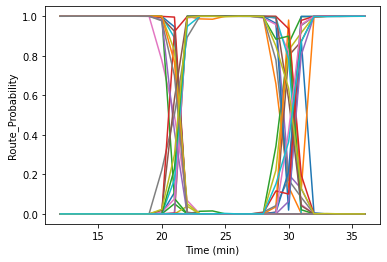

In [12]:
sample_size = [50, 100, 150, 200, 250, 300, 350, 400, 450, 500]

for s in sample_size:
    
    p1 = []
    p2 = []
    p3 = [] 
    p1_size = s * .7
    p2_size = s * .2
    p3_size = s * .1

    P = []
    T = []

    routes = []
    for i in range(int(p1_size)):
        routes.append([sample_paths[1], route_times[1][0] + random.uniform(-2.0, 2.0)])
    
    for i in range(int(p2_size)):
        routes.append([sample_paths[0], route_times[0][0] + random.uniform(-2.0, 2.0)])
    
    for i in range(int(p3_size)):
        routes.append([sample_paths[2], route_times[2][0] + random.uniform(-2.0, 2.0)])
   

    for i in range(len(routes)):
        P.append(routes[i][0])
        T.append(routes[i][1])
    
  
    times = [[],[],[]]

    for r in routes:
        if r[1] < 18.0:
            times[0].append(r[1])
        elif r[1] < 29.0:
            times[1].append(r[1])
        else:
            times[2].append(r[1])
            
    np_t1 = np.array(times[0])
    np_t2 = np.array(times[1])
    np_t3 = np.array(times[2])

    mean1 = np_t1.mean()
    std1 = np_t1.std()
    mean2 = np_t2.mean()
    std2 = np_t2.std()
    mean3 = np_t3.mean()
    std3 = np_t3.std()

    print(mean1)
    print(std1)
    print()
    print(mean2)
    print(std2)
    print()
    print(mean3)
    print(std3)
    
    minutes = [12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36]
    P_I = [0.7, 0.2, 0.1]
    pathMeanTimes = [mean1, mean2, mean3]
    pathStdOfTimes = [std1, std2, std3]
    updateInterval = 1

    for m in minutes:
        p1, p2, p3 = training(100, m, p1, p2, p3)
        
    plt.plot(minutes, p1)
    plt.xlabel('Time (min)')
    plt.ylabel('Route_Probability')
    plt.savefig('freeway_route_probabilities_' + str(s) + '.png')
    
    plt.plot(minutes, p2)
    plt.xlabel('Time (min)')
    plt.ylabel('Route_Probability')
    plt.savefig('Short_backroads_route_probabilities_' + str(s) + '.png')
    
    
    plt.plot(minutes, p3)
    plt.xlabel('Time (min)')
    plt.ylabel('Route_Probability')
    plt.savefig('Long_backroads_route_probabilities_' + str(s) + '.png')   
    
    pr1 = p1
    pr2 = p2
    pr3 = p3
    writer.writerow({'path_name': 'Freeway', 'sample_size': s, '12': pr1[0],'13':pr1[1],'14':pr1[2],'15':pr1[3],'16':pr1[4],'17':pr1[5],'18':pr1[6],'19':pr1[7],'20':pr1[8],'21':pr1[9],'22':pr1[10],'23':pr1[11],'24':pr1[12],'25':pr1[13],'26':pr1[14],'27':pr1[15],'28':pr1[16],'29':pr1[17],'30':pr1[18],'31':pr1[19],'32':pr1[20],'33':pr1[21],'34':pr1[22],'35':pr1[23],'36':pr1[24]})
    writer.writerow({'path_name': 'Short_backroads', 'sample_size': s, '12': pr2[0],'13':pr2[1],'14':pr2[2],'15':pr2[3],'16':pr2[4],'17':pr2[5],'18':pr2[6],'19':pr2[7],'20':pr2[8],'21':pr2[9],'22':pr2[10],'23':pr2[11],'24':pr2[12],'25':pr2[13],'26':pr2[14],'27':pr2[15],'28':pr2[16],'29':pr2[17],'30':pr2[18],'31':pr2[19],'32':pr2[20],'33':pr2[21],'34':pr2[22],'35':pr2[23],'36':pr2[24]})
    writer.writerow({'path_name': 'Long_backroads', 'sample_size': s, '12': pr3[0],'13':pr3[1],'14':pr3[2],'15':pr3[3],'16':pr3[4],'17':pr3[5],'18':pr3[6],'19':pr3[7],'20':pr3[8],'21':pr3[9],'22':pr3[10],'23':pr3[11],'24':pr3[12],'25':pr3[13],'26':pr3[14],'27':pr3[15],'28':pr3[16],'29':pr3[17],'30':pr3[18],'31':pr3[19],'32':pr3[20],'33':pr3[21],'34':pr3[22],'35':pr3[23],'36':pr3[24]})
        
    
data.close()